In [1]:
suppressPackageStartupMessages(library(motifbreakR))
suppressPackageStartupMessages(library(MotifDb))
suppressPackageStartupMessages(library(BSgenome))
suppressPackageStartupMessages(library(tidyr))
suppressPackageStartupMessages(library("BSgenome.Hsapiens.UCSC.hg38"))
suppressPackageStartupMessages(library(motifStack))
suppressPackageStartupMessages(library(data.table))
library(stringr)
suppressPackageStartupMessages(library(RColorBrewer))
suppressPackageStartupMessages(library(gridExtra))
suppressPackageStartupMessages(library(ggplot2))
#library(MotIV) ###(only with older versions on R (in gatsby) )
library(scales)
library(vroom)
library(parallel)
library(dplyr)
library(qvalue)
library(pheatmap)
library(RColorBrewer)

See system.file("LICENSE", package="MotifDb") for use restrictions.


Attaching package: 'vroom'


The following object is masked from 'package:scales':

    col_factor



Attaching package: 'dplyr'


The following object is masked from 'package:gridExtra':

    combine


The following objects are masked from 'package:data.table':

    between, first, last


The following objects are masked from 'package:Biostrings':

    collapse, intersect, setdiff, setequal, union


The following object is masked from 'package:XVector':

    slice


The following objects are masked from 'package:GenomicRanges':

    intersect, setdiff, union


The following object is masked from 'package:GenomeInfoDb':

    intersect


The following objects are masked from 'package:IRanges':

    collapse, desc, intersect, setdiff, slice, union


The following objects are masked from 'package:S4Vectors':

    first, intersect, rename, setdiff, setequal, union


The following objects are masked from 'package:BiocGene

In [2]:
sessionInfo()

R version 4.3.3 (2024-02-29)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 20.04.2 LTS

Matrix products: default
BLAS/LAPACK: /home/welison/.conda/envs/mamba/envs/motifbreakR/lib/libopenblasp-r0.3.27.so;  LAPACK version 3.12.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

time zone: America/Los_Angeles
tzcode source: system (glibc)

attached base packages:
 [1] parallel  stats4    grid      stats     graphics  grDevices utils    
 [8] datasets  methods   base     

other attached packages:
 [1] pheatmap_1.0.12                   qvalue_2.34.0                    
 [3] dplyr_1.1.4                       vroom_1.6.5                      
 [5] scales_1.3.0      

In [3]:
#cts <- c('B','Cholangiocyte','Endothelial','Hepatocytes','HSC','Myeloid','NK','T')
cts <- c('Cholangiocyte','Endothelial','Hepatocytes','HSC','Myeloid')
out.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/motifs/'

In [4]:
sig.rna <- data.frame()
for (cell in cts) {
    ct.res <- read.table(paste0('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/outs/',cell,'.qvalue.cis_qtl.txt.gz'), header=T)
    ct.res$cell <- cell
    #ct.res <- filter(ct.res, qval < 0.05)
    sig.rna <- rbind(sig.rna, ct.res)
}

dim(sig.rna)
head(sig.rna)

[1] 74082    20

,phenotype_id,num_var,beta_shape1,beta_shape2,true_df,pval_true_df,variant_id,start_distance,end_distance,ma_samples,ma_count,af,pval_nominal,slope,slope_se,pval_perm,pval_beta,qval,pval_nominal_threshold,cell
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,LINC01409,917,1.01213,76.5750,45.5449,0.00692478,rs1077906,742128,742128,27,31,0.1802330,0.003553470,0.684998,0.224479,0.410559,0.406729,0.781961,4.01512e-06,Cholangiocyte
2,LINC01128,940,1.04315,74.1113,44.8522,0.00220781,rs12755088,798274,798274,25,28,0.8372090,0.000868566,-0.754650,0.213778,0.134587,0.136937,0.699671,5.34502e-06,Cholangiocyte
3,NOC2L,1103,1.02212,81.3711,45.1371,0.00309559,rs11580120,171111,171111,21,22,0.1279070,0.001336690,-0.816205,0.240950,0.213679,0.213962,0.740938,4.10643e-06,Cholangiocyte
4,HES4,1106,1.03936,79.8580,44.5990,0.03556170,rs2298211,211691,211691,13,15,0.0872093,0.021827800,0.540157,0.228587,0.938806,0.940297,0.853070,4.81306e-06,Cholangiocyte
5,AGRN,1117,1.04741,80.6440,44.2055,0.00579690,rs56378990,207974,207974,13,14,0.0813954,0.002495730,-0.788127,0.248219,0.354965,0.351778,0.766923,5.08037e-06,Cholangiocyte
6,C1orf159,1255,1.03683,90.8310,44.7190,0.00321626,rs12755088,507051,507051,25,28,0.8372090,0.001326220,0.635457,0.187446,0.237776,0.238012,0.746408,4.14664e-06,Cholangiocyte


In [5]:
sig.atac <- data.frame()
for (cell in cts) {
    ct.res <- read.table(paste0('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/05_caQTLs/outs/',cell,'.cis_qtl.txt.gz'), header=T)
    ct.res$cell <- cell
    #ct.res <- filter(ct.res, qval < 0.05)
    sig.atac <- rbind(sig.atac, ct.res)
}

dim(sig.atac)
head(sig.atac)

[1] 1007510      20

,phenotype_id,num_var,beta_shape1,beta_shape2,true_df,pval_true_df,variant_id,start_distance,end_distance,ma_samples,ma_count,af,pval_nominal,slope,slope_se,pval_perm,pval_beta,qval,pval_nominal_threshold,cell
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,chr1-9967-10267,117,1.02596,21.4121,45.8700,0.07232420,rs4475691,901460,901161,30,35,0.2034880,0.053223200,-0.298978,0.151208,0.7949210,0.792074,0.926209,4.54629e-06,Cholangiocyte
2,chr1-181284-181584,351,1.00876,37.3429,45.4522,0.00214482,rs71628941,952988,952689,28,30,0.1744190,0.000909791,-0.603653,0.171743,0.0736926,0.075080,0.822174,2.21166e-06,Cholangiocyte
3,chr1-778585-778885,917,1.02516,75.0036,45.3630,0.01325100,rs35916504,166673,166374,35,39,0.2267440,0.007374360,0.413973,0.148555,0.6307370,0.621525,0.909205,1.28871e-06,Cholangiocyte
4,chr1-827378-827678,942,1.04057,74.2060,44.3433,0.00654736,rs1695857,595449,595150,11,13,0.0755814,0.002926940,-0.677366,0.217126,0.3719630,0.366415,0.873048,1.50342e-06,Cholangiocyte
5,chr1-869776-870076,973,1.03399,71.6186,44.2902,0.02557360,rs117039017,40116,39817,9,9,0.0523256,0.014503200,0.917072,0.362829,0.8342170,0.835205,0.929414,1.46595e-06,Cholangiocyte
6,chr1-904604-904904,1009,1.04460,73.6191,44.2797,0.01279590,rs9442373,222653,222354,60,74,0.5697670,0.006410340,0.421197,0.148384,0.5971400,0.592964,0.905362,1.57227e-06,Cholangiocyte


In [6]:
sig.h3k27ac <- data.frame()
for (cell in cts) {
    ct.res <- read.table(paste0('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/06_H3K27acQTLs/outs/',cell,'.qvalue.cis_qtl.txt.gz'), header=T)
    if (!'pval_nominal_threshold' %in% colnames(ct.res)) {
        ct.res$pval_nominal_threshold <- -Inf
    }
    ct.res$cell <- cell
    #ct.res <- filter(ct.res, qval < 0.05)
    sig.h3k27ac <- rbind(sig.h3k27ac, ct.res)
}

dim(sig.h3k27ac)
head(sig.h3k27ac)

[1] 589804     20

,phenotype_id,num_var,beta_shape1,beta_shape2,true_df,pval_true_df,variant_id,start_distance,end_distance,ma_samples,ma_count,af,pval_nominal,slope,slope_se,pval_perm,pval_beta,qval,pval_nominal_threshold,cell
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,chr1:9595-10594,117,0.993378,20.8012,46.3997,0.06474200,rs72902552,909453,908455,9,10,0.0581395,0.048227900,-0.563676,0.278760,0.751425,0.753710,0.969096,-Inf,Cholangiocyte
2,chr1:180356-181355,351,0.996492,36.5828,45.9017,0.03500340,rs41285802,776723,775725,10,10,0.0581395,0.023383100,-1.006030,0.430913,0.727027,0.729671,0.967426,-Inf,Cholangiocyte
3,chr1:778240-779239,917,1.014440,78.8403,46.1129,0.01137260,rs3748597,175038,174040,13,14,0.9186050,0.006620400,0.771233,0.272841,0.592441,0.587663,0.957361,-Inf,Cholangiocyte
4,chr1:827190-828189,943,1.020370,73.2033,44.7480,0.00829908,rs28615823,174679,173681,30,31,0.1802330,0.004037490,-0.559920,0.186258,0.454055,0.446797,0.948561,-Inf,Cholangiocyte
5,chr1:938028-939027,1087,1.003940,69.1654,43.4173,0.00799701,rs12066716,250025,249027,28,31,0.1802330,0.003353700,0.614697,0.200101,0.422158,0.424199,0.946755,-Inf,Cholangiocyte
6,chr1:958791-959790,1103,1.034430,78.6256,44.5462,0.00164007,rs13303065,-3113,-4111,62,80,0.5348840,0.000587107,0.500264,0.136791,0.109189,0.111063,0.916935,-Inf,Cholangiocyte


In [7]:
sig.h3k27me3 <- data.frame()
for (cell in cts) {
    ct.res <- read.table(paste0('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/07_H3K27me3QTLs/outs/',cell,'.qvalue.cis_qtl.txt.gz'), header=T)
    if (!'pval_nominal_threshold' %in% colnames(ct.res)) {
        ct.res$pval_nominal_threshold <- -Inf
    }
    ct.res$cell <- cell
    #ct.res <- filter(ct.res, qval < 0.05)
    sig.h3k27me3 <- rbind(sig.h3k27me3, ct.res)
}

dim(sig.h3k27me3)
head(sig.h3k27me3)

[1] 918267     20

,phenotype_id,num_var,beta_shape1,beta_shape2,true_df,pval_true_df,variant_id,start_distance,end_distance,ma_samples,ma_count,af,pval_nominal,slope,slope_se,pval_perm,pval_beta,qval,pval_nominal_threshold,cell
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,chr1:9566-11065,117,0.990140,23.1171,47.4167,0.014209300,rs2879815,956859,955361,22,27,0.1569770,9.49508e-03,-0.821905,0.305364,0.2883710,0.2861320,0.933079,1.72503e-07,Cholangiocyte
2,chr1:87293-88792,203,0.993392,26.7469,45.4578,0.086417200,rs3828049,866564,865066,10,11,0.0639535,6.39061e-02,-0.505934,0.267351,0.9096090,0.9118630,0.985004,1.55484e-07,Cholangiocyte
3,chr1:863693-865192,970,1.016120,74.1302,44.2932,0.000340139,rs34530354,262720,261222,49,60,0.3488370,8.76271e-05,0.646108,0.152109,0.0227977,0.0233075,0.927344,7.47115e-08,Cholangiocyte
4,chr1:869154-870653,973,1.025560,76.5134,44.8116,0.000789332,rs34612277,96511,95013,32,35,0.2034880,2.58794e-04,-0.722510,0.184485,0.0523948,0.0539620,0.927344,8.12286e-08,Cholangiocyte
5,chr1:872787-874286,976,1.033180,70.7685,43.8268,0.014323300,rs11260558,326465,324967,31,36,0.2093020,7.02174e-03,-0.434270,0.154827,0.6289370,0.6256840,0.966442,9.62456e-08,Cholangiocyte
6,chr1:885906-887405,990,1.022880,77.3305,44.7482,0.018054800,rs11260539,288616,287118,13,14,0.0813954,1.00095e-02,-0.755718,0.282886,0.7476250,0.7478590,0.975079,7.77970e-08,Cholangiocyte


In [18]:
length(unique(sig.rna$variant_id))
length(unique(sig.atac$variant_id))
length(unique(sig.h3k27ac$variant_id))
length(unique(sig.h3k27me3$variant_id))

unique_lead_snps <- unique(c(sig.rna$variant_id, sig.atac$variant_id, sig.h3k27me3$variant_id, sig.h3k27me3$variant_id))
unique_lead_snps <- unique_lead_snps[unique_lead_snps != '.']

length(unique_lead_snps)
head(unique_lead_snps)

[1] 69568

[1] 660985

[1] 437772

[1] 650344

[1] 1075833

[1] "rs1077906"  "rs12755088" "rs11580120" "rs2298211"  "rs56378990"
[6] "rs55692389"

In [11]:
snp.info <- vroom('/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/04_eQTLs/genotypes/Liver.QTL.r209.maf05.matchednames.bim', delim='\t', col_names = FALSE)

dim(snp.info)
head(snp.info)

Rows: 5492117 Columns: 6
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (4): X1, X2, X5, X6
dbl (2): X3, X4

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 5492117       6

X1,X2,X3,X4,X5,X6
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
chr10,rs11594819,0,116162,C,A
chr10,rs72770958,0,125824,G,C
chr10,rs7089889,0,132494,G,T
chr10,rs73581705,0,136160,T,C
chr10,rs12146291,0,142865,G,A
chr10,rs17156310,0,155638,A,G


In [20]:
sum(unique_lead_snps %in% snp.info$X2)

[1] 1075833

In [19]:
lead.snp.info <- filter(snp.info, X2 %in% unique_lead_snps)
dim(lead.snp.info)
head(lead.snp.info)

[1] 1075833       6

X1,X2,X3,X4,X5,X6
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
chr10,rs11594819,0,116162,C,A
chr10,rs73581705,0,136160,T,C
chr10,rs12146291,0,142865,G,A
chr10,rs7909551,0,161889,C,T
chr10,rs5782545,0,182506,T,TGAAAAA
chr10,rs28838966,0,207780,T,G


In [29]:
lead.snp.info <- filter(lead.snp.info, X5 %in% c('C','A','G','T') & X6 %in% c('C','A','G','T'))

dim(lead.snp.info)
head(lead.snp.info)

[1] 1023189       6

X1,X2,X3,X4,X5,X6
<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
chr10,rs11594819,0,116162,C,A
chr10,rs73581705,0,136160,T,C
chr10,rs12146291,0,142865,G,A
chr10,rs7909551,0,161889,C,T
chr10,rs28838966,0,207780,T,G
chr10,rs74332769,0,214104,C,T


In [34]:
options(scipen = 100)
lead.snp.info.bed <- mutate(lead.snp.info, chr=X1, start=X4 - 1, end=X4, rsid=paste0(X1,":",X4,":",X6,":",X5), 0, "+", .keep = 'none')
dim(lead.snp.info.bed)
head(lead.snp.info.bed)
write.table(lead.snp.info.bed, paste0(out.dir, 'lead.snps.bed'), sep='\t', col.names=F, row.names=F, quote=F)

[1] 1023189       6

chr,start,end,rsid,0,"""+"""
<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>
chr10,116161,116162,chr10:116162:A:C,0,+
chr10,136159,136160,chr10:136160:C:T,0,+
chr10,142864,142865,chr10:142865:A:G,0,+
chr10,161888,161889,chr10:161889:T:C,0,+
chr10,207779,207780,chr10:207780:G:T,0,+
chr10,214103,214104,chr10:214104:T:C,0,+


In [35]:
snps <- snps.from.file(file = paste0(out.dir, 'lead.snps.bed'),search.genome = BSgenome.Hsapiens.UCSC.hg38,format = "bed")                                 
snps

GRanges object with 1023189 ranges and 3 metadata columns:
                     seqnames    ranges strand |             SNP_id
                        <Rle> <IRanges>  <Rle> |        <character>
    chr10:116162:A:C    chr10    116162      * |   chr10:116162:A:C
    chr10:136160:C:T    chr10    136160      * |   chr10:136160:C:T
    chr10:142865:A:G    chr10    142865      * |   chr10:142865:A:G
    chr10:161889:T:C    chr10    161889      * |   chr10:161889:T:C
    chr10:207780:G:T    chr10    207780      * |   chr10:207780:G:T
                 ...      ...       ...    ... .                ...
  chr9:138114424:C:T     chr9 138114424      * | chr9:138114424:C:T
  chr9:138114563:C:T     chr9 138114563      * | chr9:138114563:C:T
  chr9:138122079:C:T     chr9 138122079      * | chr9:138122079:C:T
  chr9:138122788:C:T     chr9 138122788      * | chr9:138122788:C:T
  chr9:138123517:C:T     chr9 138123517      * | chr9:138123517:C:T
                                REF            ALT
      

##### Run motifbreakR

In [36]:
#hocomoco2 = MotifDb[mcols(MotifDb)$dataSource=='HOCOMOCOv10' & mcols(MotifDb)$organism=='Hsapiens']
jaspar = MotifDb[mcols(MotifDb)$dataSource=='jaspar2022' & mcols(MotifDb)$organism=='Hsapiens']

snps <- snps.from.file(file = paste0(out.dir, 'lead.snps.bed'),search.genome = BSgenome.Hsapiens.UCSC.hg38,format = "bed")                                 
n = length(snps)
s =seq(1, n, by=200)
end = s[length(s)-1]
e =c(seq(200, n, by=200),n)

In [38]:
for (i in seq(1:length(s))){
    test=snps[s[i]:e[i]]
    results <- mclapply(1:length(test), function(x) data.frame(motifbreakR(snpList = test[x], filterp = TRUE,
                       pwmList = jaspar,
                       method="ic",
                       threshold = 5e-4,
                       BPPARAM = BiocParallel::bpparam("SerialParam"))), mc.cores=18 )

    rb = rbindlist(results[lapply(results, class) == "data.frame"])
                         
    rb$motifPos2 <- sapply(rb$motifPos,"[[",2)
    rb$motifPos <- sapply(rb$motifPos,"[[",1)

    if(nrow(rb)>0){
      write.table(rb,  paste0(out.dir,"jaspar/Results_JASPAR2022_", s[i], "_", e[i], ".tsv"), quote=F, row.names=F, sep="\t")  
    }
    message(paste0(i, " out of ", length(s)))
                        
    gc()
}   
                        #1:25 AM

1 out of 5116

2 out of 5116

3 out of 5116

4 out of 5116

5 out of 5116

6 out of 5116

7 out of 5116

8 out of 5116

9 out of 5116

10 out of 5116

11 out of 5116

12 out of 5116

13 out of 5116

14 out of 5116

15 out of 5116

16 out of 5116

17 out of 5116

18 out of 5116

19 out of 5116

20 out of 5116

21 out of 5116

22 out of 5116

23 out of 5116

24 out of 5116

25 out of 5116

26 out of 5116

27 out of 5116

28 out of 5116

29 out of 5116

30 out of 5116

31 out of 5116

32 out of 5116

33 out of 5116

34 out of 5116

35 out of 5116

36 out of 5116

37 out of 5116

38 out of 5116

39 out of 5116

40 out of 5116

41 out of 5116

42 out of 5116

43 out of 5116

44 out of 5116

45 out of 5116

46 out of 5116

47 out of 5116

48 out of 5116

49 out of 5116

50 out of 5116

51 out of 5116

52 out of 5116

53 out of 5116

54 out of 5116

55 out of 5116

56 out of 5116

57 out of 5116

58 out of 5116

59 out of 5116

60 out of 5116

61 out of 5116

62 out of 5116

63 out of 5116

6

In [ ]:
# From TSCC
bash slurm.submit.no.array.sh

#### Check it all ran

In [66]:
exists <- logical()
for (i in seq(1:length(s))){
    exists <- c(exists, file.exists(paste0(out.dir,"jaspar.tscc/Results_JASPAR2022_", s[i], "_", e[i], ".tsv"))  )
}   

In [67]:
sum(exists)

[1] 5116

In [68]:
length(exists)

[1] 5116

In [69]:
as.character(which(!exists))

character(0)

In [ ]:
for i in 500 1000 1500 2000 2500 2997 2998 2999 3000 3001 3002 3003 3159 3160 3161 3162 3163 3164 3165 3500 3999 4000 4001 4002 4003 4004 4005 4500 5000; do srun --output=log/$i.log --error=log/$i.err --nodes=1 --ntasks-per-node=1 --cpus-per-task=5 --mem=20G --account=csd854 -t 00:60:00 -p condo -q condo Rscript motifbreakR.Rscript $i & done

### Compile results

In [70]:
files = list.files(paste0(out.dir,"jaspar.tscc"))[grepl("Results_JASPAR2022", list.files(paste0(out.dir,"jaspar.tscc")))]

In [71]:
length(files)

[1] 5126

In [72]:
RES = data.frame()
for( f in files){
    res = read.table(paste0(out.dir,'jaspar.tscc/',f),  row.names=NULL, header=T, sep="\t", stringsAsFactors = F)
    RES = rbind(RES, res)
}

tab = RES[, c(6,10:21, 26,27,25)]
tab = tab[order(-abs(tab$alleleDiff)),]
tab = tab[!duplicated(tab[,c('SNP_id','geneSymbol' )]),]

dim(tab) #Run4 381113x16

write.table(tab, paste0(out.dir,"Summary_significant_motifs_JASPAR2022_leads.tsv"), sep="\t", row.names=F, quote=F)

strong = subset(tab,effect=="strong" )

[1] 9396570      16

In [73]:
RES[,9:15]

varType,motifPos,geneSymbol,dataSource,providerName,providerId,seqMatch
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
SNV,-13,POU4F2,jaspar2022,MA0683.1,MA0683.1,atctattaaatatcCgtcttgttttgacaa
SNV,-1,ETV5::FOXI1,jaspar2022,MA1946.1,MA1946.1,ctattaaatatcCgtcttgttttga
SNV,-2,FOXO1::FLI1,jaspar2022,MA1956.1,MA1956.1,tctattaaatatcCgtcttgttttgac
SNV,-11,ETV2::HOXB13,jaspar2022,MA1943.1,MA1943.1,atctattaaatatcCgtcttgttttgaca
SNV,-6,SPDEF,jaspar2022,MA0686.1,MA0686.1,attaaatatcCgtcttgtttt
SNV,-6,ETV4,jaspar2022,MA0764.3,MA0764.3,gcggacctcCgggacagtc
SNV,-6,ELK1,jaspar2022,MA0028.2,MA0028.2,gcggacctcCgggacagtc
SNV,-6,SPDEF,jaspar2022,MA0686.1,MA0686.1,cgcggacctcCgggacagtcc
SNV,-7,FEV,jaspar2022,MA0156.3,MA0156.3,tcgcggacctcCgggacagtcct


In [74]:
dim(RES) #Run4 388681x24
head(RES)

[1] 9482508      29

,seqnames,start,end,width,strand,SNP_id,REF,ALT,varType,motifPos,⋯,Refpvalue,Altpvalue,snpPos,alleleRef,alleleAlt,effect,altPos,alleleDiff,alleleEffectSize,motifPos2
,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,⋯,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<chr>,<int>,<dbl>,<dbl>,<int>
1,chr10,116162,116162,1,-,chr10:116162:A:C,A,C,SNV,-13,⋯,NA,NA,NA,NA,NA,strong,1,1.3298482,0.07093317,2
2,chr10,116162,116162,1,-,chr10:116162:A:C,A,C,SNV,-1,⋯,NA,NA,NA,NA,NA,strong,1,1.1724462,0.10060227,11
3,chr10,116162,116162,1,-,chr10:116162:A:C,A,C,SNV,-2,⋯,NA,NA,NA,NA,NA,strong,1,0.8288614,0.05084896,11
4,chr10,116162,116162,1,-,chr10:116162:A:C,A,C,SNV,-11,⋯,NA,NA,NA,NA,NA,strong,1,1.9883025,0.14459390,3
5,chr10,116162,116162,1,-,chr10:116162:A:C,A,C,SNV,-6,⋯,NA,NA,NA,NA,NA,strong,1,1.9856981,0.15188414,4
6,chr10,136160,136160,1,-,chr10:136160:C:T,C,T,SNV,-6,⋯,NA,NA,NA,NA,NA,strong,1,-1.9993872,-0.19349161,3


In [75]:
dim(strong) #Run4 298829x16

[1] 8277031      16

In [76]:
write.table(strong, paste0(out.dir,"Summary_significant_motifs_JASPAR2022_strong_leads.tsv"), sep="\t", row.names=F, quote=F)

# Enrichment Test

We got a little lost on all this enrichment testing, I am going to remake the cell type test

In [2]:
out.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/motifs/'

motifs <- read.table(paste0(out.dir,"Summary_significant_motifs_JASPAR2022_leads.tsv"), sep="\t", header=T)
#motifs <- RES
dim(motifs)
head(motifs)

ERROR: Error in eval(expr, envir, enclos): object 'out.dir' not found


In [78]:
#strong <- read.table("/nfs/lab/welison/islet_multiome/intermediates/caQTLs/231026_WE_caQTLs/motifs/Summary_significant_motifs_JASPAR2022_strong_inpeaks_filtered_leads_Run1F.tsv", sep="\t", header=T)
dim(strong)
head(strong)

[1] 8277031      16

,SNP_id,motifPos,geneSymbol,dataSource,providerName,providerId,seqMatch,pctRef,pctAlt,scoreRef,scoreAlt,Refpvalue,Altpvalue,altPos,alleleDiff,effect
,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<int>,<dbl>,<chr>
70125,chr11:121145002:C:T,-1,TCFL5,jaspar2022,MA0632.2,MA0632.2,aattctgacCacgggctca,0.8997731,0.7082916,9.488793,7.488901,NA,NA,1,-1.999892,strong
147533,chr9:121487307:G:A,-8,TCFL5,jaspar2022,MA0632.2,MA0632.2,gctgcgcgcGgtgactcac,0.9276640,0.7361825,9.780094,7.780202,NA,NA,1,-1.999892,strong
171528,chr11:123268127:A:G,-8,TCFL5,jaspar2022,MA0632.2,MA0632.2,gttgcccgtGagcccgcca,0.7006807,0.8921623,7.409411,9.409302,NA,NA,1,1.999892,strong
342234,chr12:5432005:G:A,-8,TCFL5,jaspar2022,MA0632.2,MA0632.2,gcggcgcggGccggcgggg,0.9106367,0.7191551,9.602255,7.602364,NA,NA,1,-1.999892,strong
344149,chr10:21160516:C:T,-1,TCFL5,jaspar2022,MA0632.2,MA0632.2,cttaattatCacgtgcctt,0.9098305,0.7183489,9.593835,7.593943,NA,NA,1,-1.999892,strong
361541,chr12:8996148:C:T,-1,TCFL5,jaspar2022,MA0632.2,MA0632.2,aagaaaacaCgcgtgcacg,0.8938844,0.7024029,9.427290,7.427398,NA,NA,1,-1.999892,strong


In [84]:
rsid_to_posid <- mutate(lead.snp.info, rsid=paste0(X1,":",X4,":",X6,":",X5), variant_id=X2,.keep = 'none')

dim(rsid_to_posid)
head(rsid_to_posid)

[1] 1023189       2

rsid,variant_id
<chr>,<chr>
chr10:116162:A:C,rs11594819
chr10:136160:C:T,rs73581705
chr10:142865:A:G,rs12146291
chr10:161889:T:C,rs7909551
chr10:207780:G:T,rs28838966
chr10:214104:T:C,rs74332769


### RNA

In [89]:
sig.rna.filt <- filter(sig.rna, variant_id != '.') %>%
    left_join(rsid_to_posid)

dim(sig.rna)

sum(is.na(sig.rna.filt$rsid))

sig.rna.filt <- filter(sig.rna.filt, !is.na(rsid))

dim(sig.rna.filt)
head(sig.rna.filt)

Joining with `by = join_by(variant_id)`


[1] 74082    20

[1] 3673

[1] 70391    21

,phenotype_id,num_var,beta_shape1,beta_shape2,true_df,pval_true_df,variant_id,start_distance,end_distance,ma_samples,⋯,af,pval_nominal,slope,slope_se,pval_perm,pval_beta,qval,pval_nominal_threshold,cell,rsid
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,LINC01409,917,1.01213,76.5750,45.5449,0.00692478,rs1077906,742128,742128,27,⋯,0.1802330,0.003553470,0.684998,0.224479,0.410559,0.406729,0.781961,0.00000401512,Cholangiocyte,chr1:1520875:A:G
2,LINC01128,940,1.04315,74.1113,44.8522,0.00220781,rs12755088,798274,798274,25,⋯,0.8372090,0.000868566,-0.754650,0.213778,0.134587,0.136937,0.699671,0.00000534502,Cholangiocyte,chr1:1623412:T:C
3,NOC2L,1103,1.02212,81.3711,45.1371,0.00309559,rs11580120,171111,171111,21,⋯,0.1279070,0.001336690,-0.816205,0.240950,0.213679,0.213962,0.740938,0.00000410643,Cholangiocyte,chr1:1130420:C:T
4,HES4,1106,1.03936,79.8580,44.5990,0.03556170,rs2298211,211691,211691,13,⋯,0.0872093,0.021827800,0.540157,0.228587,0.938806,0.940297,0.853070,0.00000481306,Cholangiocyte,chr1:1211863:A:C
5,AGRN,1117,1.04741,80.6440,44.2055,0.00579690,rs56378990,207974,207974,13,⋯,0.0813954,0.002495730,-0.788127,0.248219,0.354965,0.351778,0.766923,0.00000508037,Cholangiocyte,chr1:1228094:A:G
6,C1orf159,1255,1.03683,90.8310,44.7190,0.00321626,rs12755088,507051,507051,25,⋯,0.8372090,0.001326220,0.635457,0.187446,0.237776,0.238012,0.746408,0.00000414664,Cholangiocyte,chr1:1623412:T:C


In [149]:
motifs$disrupted <- TRUE
motifs_wide <- arrange(motifs, -abs(alleleEffectSize)) %>%
    distinct(SNP_id, geneSymbol, .keep_all = TRUE) %>%
    select(SNP_id, geneSymbol, disrupted) %>%
    group_by(SNP_id) %>%
    pivot_wider(names_from=geneSymbol, values_from=disrupted, values_fill=FALSE)

full.res.rna <- data.frame()

for (c in unique(sig.rna.filt$cell)) {
    ct_lead <- filter(sig.rna.filt, cell == c)
    ct_lead_motif <- left_join(ct_lead, motifs_wide, join_by(rsid==SNP_id))
    ct_lead_motif <- filter(ct_lead_motif, !is.na(ISL2))
    ct_lead_motif$flag_fdr05 <- ct_lead_motif$qval < 0.05
    if(sum(ct_lead_motif$flag_fdr05) == 0) {
        next
    }
    
    ct.res <- data.frame()
    for (test.motif in colnames(motifs_wide)[2:ncol(motifs_wide)]) {
        test.res <- broom::tidy(fisher.test(table(ct_lead_motif[c('flag_fdr05', test.motif)])))
        test.res$cell <- c
        test.res$motif <- test.motif
        ct.res <- rbind(ct.res, test.res)
    }
    
    ct.res[ct.res$p.value > 1,]$p.value <- 1
    ct.res[ct.res$p.value < 0,]$p.value <- 0
    ct.res$q.value <- qvalue(ct.res$p.value)$qvalues
    ct.res <- arrange(ct.res, q.value)
    
    full.res.rna <- rbind(full.res.rna, ct.res)
}

dim(full.res.rna)
head(full.res.rna)

write.table(full.res.rna,paste0(out.dir,"JASPAR_2022_motifbreakR_enrichment_RNA.tsv"), sep='\t', col.names=T, row.names=F, quote=F)

[1] 3225    9

estimate,p.value,conf.low,conf.high,method,alternative,cell,motif,q.value
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
0,1,0,16.20488,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,HOXA6,1
0,1,0,11.11232,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,HOXA7,1
0,1,0,11.44047,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,HOXB6,1
0,1,0,18.51758,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,VAX2,1
0,1,0,18.51758,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,HOXA9,1
0,1,0,12.54220,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,SHOX,1


### ATAC

In [147]:
sig.atac.filt <- filter(sig.atac, variant_id != '.') %>%
    left_join(rsid_to_posid)

dim(sig.atac)

sum(is.na(sig.atac.filt$rsid))

sig.atac.filt <- filter(sig.atac.filt, !is.na(rsid))

dim(sig.atac.filt)
head(sig.atac.filt)

Joining with `by = join_by(variant_id)`


[1] 1007510      20

[1] 48376

[1] 958955     21

,phenotype_id,num_var,beta_shape1,beta_shape2,true_df,pval_true_df,variant_id,start_distance,end_distance,ma_samples,⋯,af,pval_nominal,slope,slope_se,pval_perm,pval_beta,qval,pval_nominal_threshold,cell,rsid
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,chr1-9967-10267,117,1.02596,21.4121,45.8700,0.07232420,rs4475691,901460,901161,30,⋯,0.2034880,0.053223200,-0.298978,0.151208,0.7949210,0.792074,0.926209,0.00000454629,Cholangiocyte,chr1:911428:C:T
2,chr1-181284-181584,351,1.00876,37.3429,45.4522,0.00214482,rs71628941,952988,952689,28,⋯,0.1744190,0.000909791,-0.603653,0.171743,0.0736926,0.075080,0.822174,0.00000221166,Cholangiocyte,chr1:1134273:C:T
3,chr1-827378-827678,942,1.04057,74.2060,44.3433,0.00654736,rs1695857,595449,595150,11,⋯,0.0755814,0.002926940,-0.677366,0.217126,0.3719630,0.366415,0.873048,0.00000150342,Cholangiocyte,chr1:1422828:G:T
4,chr1-869776-870076,973,1.03399,71.6186,44.2902,0.02557360,rs117039017,40116,39817,9,⋯,0.0523256,0.014503200,0.917072,0.362829,0.8342170,0.835205,0.929414,0.00000146595,Cholangiocyte,chr1:909893:G:A
5,chr1-904604-904904,1009,1.04460,73.6191,44.2797,0.01279590,rs9442373,222653,222354,60,⋯,0.5697670,0.006410340,0.421197,0.148384,0.5971400,0.592964,0.905362,0.00000157227,Cholangiocyte,chr1:1127258:C:A
6,chr1-921085-921385,1042,1.04931,74.4378,43.9577,0.00420901,rs6696971,41272,40973,16,⋯,0.0988372,0.001657060,0.727383,0.219408,0.2502750,0.248172,0.861647,0.00000162278,Cholangiocyte,chr1:962358:C:T


In [150]:
motifs$disrupted <- TRUE
motifs_wide <- arrange(motifs, -abs(alleleEffectSize)) %>%
    distinct(SNP_id, geneSymbol, .keep_all = TRUE) %>%
    select(SNP_id, geneSymbol, disrupted) %>%
    group_by(SNP_id) %>%
    pivot_wider(names_from=geneSymbol, values_from=disrupted, values_fill=FALSE)

full.res.atac <- data.frame()

for (c in unique(sig.atac.filt$cell)) {
    ct_lead <- filter(sig.atac.filt, cell == c)
    ct_lead_motif <- left_join(ct_lead, motifs_wide, join_by(rsid==SNP_id))
    ct_lead_motif <- filter(ct_lead_motif, !is.na(ISL2))
    ct_lead_motif$flag_fdr05 <- ct_lead_motif$qval < 0.05
    if(sum(ct_lead_motif$flag_fdr05) == 0) {
        next
    }
    
    ct.res <- data.frame()
    for (test.motif in colnames(motifs_wide)[2:ncol(motifs_wide)]) {
        test.res <- broom::tidy(fisher.test(table(ct_lead_motif[c('flag_fdr05', test.motif)])))
        test.res$cell <- c
        test.res$motif <- test.motif
        ct.res <- rbind(ct.res, test.res)
    }
    
    ct.res[ct.res$p.value > 1,]$p.value <- 1
    ct.res[ct.res$p.value < 0,]$p.value <- 0
    ct.res$q.value <- qvalue(ct.res$p.value)$qvalues
    ct.res <- arrange(ct.res, q.value)
    
    full.res.atac <- rbind(full.res.atac, ct.res)
}

dim(full.res.atac)
head(full.res.atac)

write.table(full.res.atac,paste0(out.dir,"JASPAR_2022_motifbreakR_enrichment_ATAC.tsv"), sep='\t', col.names=T, row.names=F, quote=F)

[1] 3225    9

estimate,p.value,conf.low,conf.high,method,alternative,cell,motif,q.value
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
0.000000,1.00000000,0.0000000,14.29346,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,HOXA6,1
0.000000,1.00000000,0.0000000,10.93322,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,HOXA7,1
0.000000,1.00000000,0.0000000,10.97866,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,HOXB6,1
0.000000,1.00000000,0.0000000,21.45001,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,VAX2,1
6.792293,0.03766099,0.7981844,25.98529,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,HOXA9,1
0.000000,1.00000000,0.0000000,14.77197,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,SHOX,1


### H3K27ac

In [151]:
sig.h3k27ac.filt <- filter(sig.h3k27ac, variant_id != '.') %>%
    left_join(rsid_to_posid)

dim(sig.h3k27ac)

sum(is.na(sig.h3k27ac.filt$rsid))

sig.h3k27ac.filt <- filter(sig.h3k27ac.filt, !is.na(rsid))

dim(sig.h3k27ac.filt)
head(sig.h3k27ac.filt)

Joining with `by = join_by(variant_id)`


[1] 589804     20

[1] 182268

[1] 407445     21

,phenotype_id,num_var,beta_shape1,beta_shape2,true_df,pval_true_df,variant_id,start_distance,end_distance,ma_samples,⋯,af,pval_nominal,slope,slope_se,pval_perm,pval_beta,qval,pval_nominal_threshold,cell,rsid
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,chr1:9595-10594,117,0.993378,20.8012,46.3997,0.06474200,rs72902552,909453,908455,9,⋯,0.0581395,0.048227900,-0.563676,0.278760,0.751425,0.753710,0.969096,-Inf,Cholangiocyte,chr1:919049:G:A
2,chr1:180356-181355,351,0.996492,36.5828,45.9017,0.03500340,rs41285802,776723,775725,10,⋯,0.0581395,0.023383100,-1.006030,0.430913,0.727027,0.729671,0.967426,-Inf,Cholangiocyte,chr1:957080:G:C
3,chr1:778240-779239,917,1.014440,78.8403,46.1129,0.01137260,rs3748597,175038,174040,13,⋯,0.9186050,0.006620400,0.771233,0.272841,0.592441,0.587663,0.957361,-Inf,Cholangiocyte,chr1:953279:T:C
4,chr1:827190-828189,943,1.020370,73.2033,44.7480,0.00829908,rs28615823,174679,173681,30,⋯,0.1802330,0.004037490,-0.559920,0.186258,0.454055,0.446797,0.948561,-Inf,Cholangiocyte,chr1:1001870:C:G
5,chr1:938028-939027,1087,1.003940,69.1654,43.4173,0.00799701,rs12066716,250025,249027,28,⋯,0.1802330,0.003353700,0.614697,0.200101,0.422158,0.424199,0.946755,-Inf,Cholangiocyte,chr1:1188054:T:A
6,chr1:958791-959790,1103,1.034430,78.6256,44.5462,0.00164007,rs13303065,-3113,-4111,62,⋯,0.5348840,0.000587107,0.500264,0.136791,0.109189,0.111063,0.916935,-Inf,Cholangiocyte,chr1:955679:C:T


In [158]:
motifs$disrupted <- TRUE
motifs_wide <- arrange(motifs, -abs(alleleEffectSize)) %>%
    distinct(SNP_id, geneSymbol, .keep_all = TRUE) %>%
    select(SNP_id, geneSymbol, disrupted) %>%
    group_by(SNP_id) %>%
    pivot_wider(names_from=geneSymbol, values_from=disrupted, values_fill=FALSE)

full.res.h3k27ac <- data.frame()

for (c in unique(sig.h3k27ac.filt$cell)) {
    ct_lead <- filter(sig.h3k27ac.filt, cell == c)
    ct_lead_motif <- left_join(ct_lead, motifs_wide, join_by(rsid==SNP_id))
    ct_lead_motif <- filter(ct_lead_motif, !is.na(ISL2))
    ct_lead_motif$flag_fdr05 <- ct_lead_motif$qval < 0.05
    if(sum(ct_lead_motif$flag_fdr05) == 0) {
        next
    }
    
    ct.res <- data.frame()
    for (test.motif in colnames(motifs_wide)[2:ncol(motifs_wide)]) {
        test.res <- broom::tidy(fisher.test(table(ct_lead_motif[c('flag_fdr05', test.motif)])))
        test.res$cell <- c
        test.res$motif <- test.motif
        ct.res <- rbind(ct.res, test.res)
    }
    
    ct.res[ct.res$p.value > 1,]$p.value <- 1
    ct.res[ct.res$p.value < 0,]$p.value <- 0
    ct.res$q.value <- qvalue(ct.res$p.value)$qvalues
    ct.res <- arrange(ct.res, q.value)
    
    full.res.h3k27ac <- rbind(full.res.h3k27ac, ct.res)
}

dim(full.res.h3k27ac)
head(full.res.h3k27ac)

write.table(full.res.h3k27ac,paste0(out.dir,"JASPAR_2022_motifbreakR_enrichment_H3K27ac.tsv"), sep='\t', col.names=T, row.names=F, quote=F)

[1] 1935    9

estimate,p.value,conf.low,conf.high,method,alternative,cell,motif,q.value
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
10.969295,0.003386429,2.120939,35.88820,Fisher's Exact Test for Count Data,two.sided,Endothelial,MAF,0.8218984
11.484256,0.002984736,2.219730,37.59819,Fisher's Exact Test for Count Data,two.sided,Endothelial,MAFA,0.8218984
6.990859,0.003822783,1.766215,20.27581,Fisher's Exact Test for Count Data,two.sided,Endothelial,TFAP4::FLI1,0.8218984
0.000000,1.000000000,0.000000,29.62546,Fisher's Exact Test for Count Data,two.sided,Endothelial,HOXA6,1.0000000
0.000000,1.000000000,0.000000,23.08643,Fisher's Exact Test for Count Data,two.sided,Endothelial,HOXA7,1.0000000
0.000000,1.000000000,0.000000,23.77051,Fisher's Exact Test for Count Data,two.sided,Endothelial,HOXB6,1.0000000


### H3K27me3

In [159]:
sig.h3k27me3.filt <- filter(sig.h3k27me3, variant_id != '.') %>%
    left_join(rsid_to_posid)

dim(sig.h3k27me3)

sum(is.na(sig.h3k27me3.filt$rsid))

sig.h3k27me3.filt <- filter(sig.h3k27me3.filt, !is.na(rsid))

dim(sig.h3k27me3.filt)
head(sig.h3k27me3.filt)

Joining with `by = join_by(variant_id)`


[1] 918267     20

[1] 44041

[1] 874120     21

,phenotype_id,num_var,beta_shape1,beta_shape2,true_df,pval_true_df,variant_id,start_distance,end_distance,ma_samples,⋯,af,pval_nominal,slope,slope_se,pval_perm,pval_beta,qval,pval_nominal_threshold,cell,rsid
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,chr1:9566-11065,117,0.990140,23.1171,47.4167,0.014209300,rs2879815,956859,955361,22,⋯,0.1569770,0.0094950800,-0.821905,0.305364,0.2883710,0.2861320,0.933079,0.0000001725030,Cholangiocyte,chr1:966426:G:C
2,chr1:87293-88792,203,0.993392,26.7469,45.4578,0.086417200,rs3828049,866564,865066,10,⋯,0.0639535,0.0639061000,-0.505934,0.267351,0.9096090,0.9118630,0.985004,0.0000001554840,Cholangiocyte,chr1:953858:G:A
3,chr1:863693-865192,970,1.016120,74.1302,44.2932,0.000340139,rs34530354,262720,261222,49,⋯,0.3488370,0.0000876271,0.646108,0.152109,0.0227977,0.0233075,0.927344,0.0000000747115,Cholangiocyte,chr1:1126414:A:G
4,chr1:872787-874286,976,1.033180,70.7685,43.8268,0.014323300,rs11260558,326465,324967,31,⋯,0.2093020,0.0070217400,-0.434270,0.154827,0.6289370,0.6256840,0.966442,0.0000000962456,Cholangiocyte,chr1:1199253:C:T
5,chr1:885906-887405,990,1.022880,77.3305,44.7482,0.018054800,rs11260539,288616,287118,13,⋯,0.0813954,0.0100095000,-0.755718,0.282886,0.7476250,0.7478590,0.975079,0.0000000777970,Cholangiocyte,chr1:1174523:C:T
6,chr1:889094-890593,992,1.035300,73.4758,43.7371,0.004634010,rs3813184,74525,73027,9,⋯,0.0523256,0.0018089000,1.519360,0.462447,0.2766720,0.2733720,0.932112,0.0000000950765,Cholangiocyte,chr1:963620:C:T


In [160]:
motifs$disrupted <- TRUE
motifs_wide <- arrange(motifs, -abs(alleleEffectSize)) %>%
    distinct(SNP_id, geneSymbol, .keep_all = TRUE) %>%
    select(SNP_id, geneSymbol, disrupted) %>%
    group_by(SNP_id) %>%
    pivot_wider(names_from=geneSymbol, values_from=disrupted, values_fill=FALSE)

full.res.h3k27me3 <- data.frame()

for (c in unique(sig.h3k27me3.filt$cell)) {
    ct_lead <- filter(sig.h3k27me3.filt, cell == c)
    ct_lead_motif <- left_join(ct_lead, motifs_wide, join_by(rsid==SNP_id))
    ct_lead_motif <- filter(ct_lead_motif, !is.na(ISL2))
    ct_lead_motif$flag_fdr05 <- ct_lead_motif$qval < 0.05
    if(sum(ct_lead_motif$flag_fdr05) == 0) {
        next
    }
    
    ct.res <- data.frame()
    for (test.motif in colnames(motifs_wide)[2:ncol(motifs_wide)]) {
        test.res <- broom::tidy(fisher.test(table(ct_lead_motif[c('flag_fdr05', test.motif)])))
        test.res$cell <- c
        test.res$motif <- test.motif
        ct.res <- rbind(ct.res, test.res)
    }
    
    ct.res[ct.res$p.value > 1,]$p.value <- 1
    ct.res[ct.res$p.value < 0,]$p.value <- 0
    ct.res$q.value <- qvalue(ct.res$p.value)$qvalues
    ct.res <- arrange(ct.res, q.value)
    
    full.res.h3k27me3 <- rbind(full.res.h3k27me3, ct.res)
}

dim(full.res.h3k27me3)
head(full.res.h3k27me3)

write.table(full.res.h3k27me3,paste0(out.dir,"JASPAR_2022_motifbreakR_enrichment_H3K27me3.tsv"), sep='\t', col.names=T, row.names=F, quote=F)

[1] 1935    9

estimate,p.value,conf.low,conf.high,method,alternative,cell,motif,q.value
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
Inf,0.010075103,2.519209,Inf,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,ETV7,0.4626039
Inf,0.007903004,3.218781,Inf,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,ETV4,0.4626039
Inf,0.007608482,3.344393,Inf,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,ETS1,0.4626039
Inf,0.012112213,2.091317,Inf,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,ETV6,0.4626039
Inf,0.010283723,2.467717,Inf,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,ERF,0.4626039
Inf,0.012909876,1.960516,Inf,Fisher's Exact Test for Count Data,two.sided,Cholangiocyte,ZBTB7A,0.4626039


In [8]:
paste0(out.dir,"JASPAR_2022_motifbreakR_enrichment_H3K27me3.tsv")

[1] "/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/motifs/JASPAR_2022_motifbreakR_enrichment_H3K27me3.tsv"

In [3]:
out.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/motifs/'
full.res.rna <- vroom(paste0(out.dir,"JASPAR_2022_motifbreakR_enrichment_RNA.tsv"), delim='\t')
full.res.atac <- vroom(paste0(out.dir,"JASPAR_2022_motifbreakR_enrichment_ATAC.tsv"), delim='\t')
full.res.h3k27ac <- vroom(paste0(out.dir,"JASPAR_2022_motifbreakR_enrichment_H3K27ac.tsv"), delim='\t')
full.res.h3k27me3 <- vroom(paste0(out.dir,"JASPAR_2022_motifbreakR_enrichment_H3K27me3.tsv"), delim='\t')

Rows: 3225 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (4): method, alternative, cell, motif
dbl (5): estimate, p.value, conf.low, conf.high, q.value

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 3225 Columns: 9
── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (4): method, alternative, cell, motif
dbl (5): estimate, p.value, conf.low, conf.high, q.value

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 1935 Columns: 9
── Column specification ──────────────────────────

In [5]:
head(arrange(full.res.rna, q.value))
head(arrange(full.res.atac, q.value))
head(arrange(full.res.h3k27ac, q.value))
head(arrange(full.res.h3k27me3, q.value))

estimate,p.value,conf.low,conf.high,method,alternative,cell,motif,q.value
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
12.379193,3.886681e-06,4.690023,27.735079,Fisher's Exact Test for Count Data,two.sided,HSC,SPDEF,0.002506909
10.467595,1.915325e-04,3.216933,26.551906,Fisher's Exact Test for Count Data,two.sided,HSC,TFCP2,0.061769221
4.639564,1.285655e-03,1.788568,10.149095,Fisher's Exact Test for Count Data,two.sided,HSC,POU4F3,0.201195458
4.478161,1.559655e-03,1.727219,9.793316,Fisher's Exact Test for Count Data,two.sided,HSC,POU4F1,0.201195458
5.603663,1.101178e-03,1.970185,12.985502,Fisher's Exact Test for Count Data,two.sided,HSC,NR1D1,0.201195458
3.744147,3.659229e-04,1.804639,7.018147,Fisher's Exact Test for Count Data,two.sided,Myeloid,ERF,0.236020239


estimate,p.value,conf.low,conf.high,method,alternative,cell,motif,q.value
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
4.794155,0,3.679069,6.159029,Fisher's Exact Test for Count Data,two.sided,Endothelial,FLI1,0
4.806657,0,3.673560,6.197486,Fisher's Exact Test for Count Data,two.sided,Endothelial,ETS1,0
3.960367,0,3.077047,5.031258,Fisher's Exact Test for Count Data,two.sided,Endothelial,ETV2,0
4.223187,0,3.243329,5.420637,Fisher's Exact Test for Count Data,two.sided,Endothelial,ETS2,0
4.046075,0,3.126187,5.164661,Fisher's Exact Test for Count Data,two.sided,Endothelial,ELK4,0
3.869527,0,3.069472,4.825427,Fisher's Exact Test for Count Data,two.sided,Myeloid,ETV6,0


estimate,p.value,conf.low,conf.high,method,alternative,cell,motif,q.value
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
3.546276,8.383375e-05,1.910130,6.066528,Fisher's Exact Test for Count Data,two.sided,Hepatocytes,TBXT,0.05407277
2.987004,2.962655e-04,1.646700,5.023791,Fisher's Exact Test for Count Data,two.sided,Hepatocytes,HNF4G,0.09554562
39.993181,1.717789e-04,6.203725,206.672780,Fisher's Exact Test for Count Data,two.sided,Myeloid,ZNF214,0.11079738
3.992797,6.258557e-04,1.802719,7.714552,Fisher's Exact Test for Count Data,two.sided,Hepatocytes,PITX1,0.13455898
3.725759,1.866653e-03,1.589212,7.465752,Fisher's Exact Test for Count Data,two.sided,Hepatocytes,PITX2,0.30099786
2.169540,2.425465e-03,1.302649,3.423414,Fisher's Exact Test for Count Data,two.sided,Hepatocytes,NR2F1,0.31288501


estimate,p.value,conf.low,conf.high,method,alternative,cell,motif,q.value
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
21.618378,0,15.588854,29.397416,Fisher's Exact Test for Count Data,two.sided,Hepatocytes,PITX2,0
15.486830,0,10.674780,21.874912,Fisher's Exact Test for Count Data,two.sided,Hepatocytes,PITX1,0
7.455483,0,5.400889,10.102176,Fisher's Exact Test for Count Data,two.sided,Hepatocytes,POU5F1B,0
7.284805,0,5.294110,9.852288,Fisher's Exact Test for Count Data,two.sided,Hepatocytes,POU3F1,0
7.192527,0,5.197435,9.775297,Fisher's Exact Test for Count Data,two.sided,Hepatocytes,POU3F4,0
6.973676,0,5.052647,9.452243,Fisher's Exact Test for Count Data,two.sided,Hepatocytes,POU2F1,0


In [7]:
rna.estimate <- select(filter(full.res.rna, estimate != Inf), estimate, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = estimate)
atac.estimate <- select(filter(full.res.atac, estimate != Inf), estimate, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = estimate)
h3k27ac.estimate <- select(filter(full.res.h3k27ac, estimate != Inf), estimate, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = estimate)
h3k27me3.estimate <- select(filter(full.res.h3k27me3, estimate != Inf), estimate, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = estimate)

In [10]:
ATAC.H3K27ac <- left_join(atac.estimate, h3k27ac.estimate, by='motif', suffix = c('.ATAC','.H3K27ac'))
ATAC.H3K27ac

motif,Cholangiocyte,Endothelial.ATAC,Hepatocytes.ATAC,HSC,Myeloid.ATAC,Endothelial.H3K27ac,Hepatocytes.H3K27ac,Myeloid.H3K27ac
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HOXA6,0.000000,0.7405346,1.0410018,1.1223488,0.5525397,0.000000,1.6623694,0
HOXA7,0.000000,1.2640384,1.0780098,0.3825355,1.0077984,0.000000,1.2088112,0
HOXB6,0.000000,1.0696633,1.1432920,0.8161290,0.6119932,0.000000,1.8854976,0
VAX2,0.000000,1.3642557,0.9601142,0.7003966,0.5094851,0.000000,1.1481535,0
HOXA9,6.792293,1.6817047,1.4269246,0.4732738,0.8304265,7.685834,2.0887226,0
SHOX,0.000000,1.4330420,0.8677805,0.9845176,0.3520873,0.000000,0.7864376,0
NKX6-2,0.000000,1.2969062,0.8333351,0.0000000,0.7347231,0.000000,1.6688618,0
MIXL1,0.000000,1.4556820,0.8485701,1.0004000,0.3605455,0.000000,0.8016103,0
ALX3,0.000000,1.4024993,0.8477262,0.9691501,0.3455005,0.000000,0.7614500,0


In [127]:
ATAC.H3K27ac.sig_label <- left_join(atac.sig_label, h3k27ac.sig_label, by='motif', suffix = c('.ATAC','.H3K27ac'))
ATAC.H3K27ac.sig_label

motif,Cholangiocyte,Endothelial.ATAC,Hepatocytes.ATAC,HSC,Myeloid.ATAC,Endothelial.H3K27ac,Hepatocytes.H3K27ac,Myeloid.H3K27ac
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HOXA6,1,0.6940301,0.6066893,1.0000000,0.4978642,1,1.0000000,1
HOXA7,1,0.6083208,0.5673149,1.0000000,0.8465908,1,1.0000000,1
HOXB6,1,0.7631970,0.4949629,1.0000000,0.4932332,1,0.9703866,1
VAX2,1,0.6243870,0.6705560,1.0000000,0.5726712,1,1.0000000,1
HOXA9,1,0.2626458,0.1231103,1.0000000,0.7861478,1,0.9703866,1
SHOX,1,0.4880516,0.5544805,1.0000000,0.2645659,1,1.0000000,1
NKX6-2,1,0.6316405,0.5774788,1.0000000,0.8147916,1,1.0000000,1
MIXL1,1,0.4880516,0.5408040,1.0000000,0.2964852,1,1.0000000,1
ALX3,1,0.4911718,0.5266110,1.0000000,0.2645659,1,1.0000000,1


In [16]:
ATAC.H3K27ac$motif[str_detect(ATAC.H3K27ac$motif, 'HNF')]

[1] "HNF4G" "HNF4A" "HNF1A" "HNF1B"

In [104]:
selected.motifs <- c('HNF1A', 'HNF1B', 'JUN',
                     'HNF4G', 'HNF4A', 'FOXA2', 
                     'FLI1', 'ETS1', 'ETV2', 
                     'SRF', 'FOS', 'NR3C1',
                     'SPIB', 'SPIC', 'IRF7')
selected.motifs

[1] "HNF1A" "HNF1B" "JUN"   "HNF4G" "HNF4A" "FOXA2" "FLI1"  "ETS1"  "ETV2" 
[10] "SRF"   "FOS"   "NR3C1" "SPIB"  "SPIC"  "IRF7"

In [134]:
plot.data <- filter(ATAC.H3K27ac, motif %in% selected.motifs) %>%
    select(motif, Cholangiocyte.ATAC=Cholangiocyte, Hepatocytes.ATAC, Hepatocytes.H3K27ac, 
          Endothelial.ATAC, Endothelial.H3K27ac, HSC.ATAC=HSC,
          Myeloid.ATAC, Myeloid.H3K27ac) %>%
    mutate(motif=factor(motif, levels=selected.motifs)) %>%
    arrange(motif) %>%
    tibble::column_to_rownames('motif')

plot.label <- filter(ATAC.H3K27ac.sig_label, motif %in% selected.motifs) %>%
    select(motif, Cholangiocyte.ATAC=Cholangiocyte, Hepatocytes.ATAC, Hepatocytes.H3K27ac, 
          Endothelial.ATAC, Endothelial.H3K27ac, HSC.ATAC=HSC,
          Myeloid.ATAC, Myeloid.H3K27ac) %>%
    mutate(motif=factor(motif, levels=selected.motifs)) %>%
    arrange(motif) %>%
    tibble::column_to_rownames('motif') %>%
    mutate_all(~ ifelse(. < 0.05, '*',''))

In [135]:
plot.label

,Cholangiocyte.ATAC,Hepatocytes.ATAC,Hepatocytes.H3K27ac,Endothelial.ATAC,Endothelial.H3K27ac,HSC.ATAC,Myeloid.ATAC,Myeloid.H3K27ac
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
HNF1A,,*,,,,,,
HNF1B,,*,,,,,,
JUN,,,,,,,,
HNF4G,,*,,,,,,
HNF4A,,*,,,,,,
FOXA2,,*,,,,,,
FLI1,,,,*,,,,
ETS1,,,,*,,,*,
ETV2,,,,*,,,,


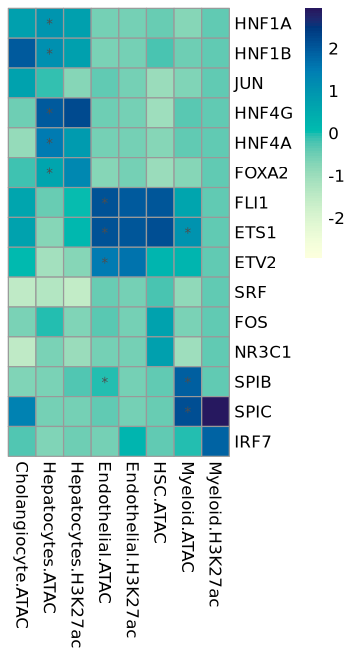

In [136]:
options(repr.plot.width=3, repr.plot.height=5.5)

pheatmap(plot.data, color = hcl.colors(100, "YlGnBu", rev=T), scale = 'column', cluster_cols = F, cluster_rows=F, display_numbers = plot.label)

In [141]:
pheatmap(plot.data, color = hcl.colors(100, "YlGnBu", rev=T),width = 3, height=5.5, fontsize_number = 20,       
             scale = 'column', cluster_cols = F, cluster_rows=F, display_numbers = plot.label,
             filename = '/nfs/lab/welison/Liver/Plots/241220_ATAC_H3K27ac_motifbreakR.pdf')

In [195]:
# Re-factorize annotations to ensure consistency
annotations <- data.frame(
  CellType = factor(c('Cholangiocyte','Hepatocytes','Hepatocytes',
                       'Endothelial','Endothelial','HSC',
                       'Myeloid','Myeloid'),
                     levels = c('Cholangiocyte', 'Hepatocytes', 'Endothelial', 'HSC', 'Myeloid')),
  Modality = factor(c('ATAC', 'ATAC', 'H3K27ac', 'ATAC', 'H3K27ac',
                      'ATAC', 'ATAC', 'H3K27ac'),
                    levels = c('ATAC', 'H3K27ac'))
)
rownames(annotations) <- paste0(annotations$CellType,".",annotations$Modality)

colors <- list(
  CellType = c(Endothelial = "#E41A1C", Myeloid = "#FF7F00",   
                Cholangiocyte = "#FFD92F", HSC = "#1E90FF", Hepatocytes = "#4DAF4A"),
  Modality = c(ATAC = 'lightskyblue', H3K27ac = 'sandybrown')
)

options(repr.plot.width=5, repr.plot.height=6)

# Create heatmap
pheatmap(plot.data, fontsize = 14,
         color = hcl.colors(100, "YlGnBu", rev = TRUE), 
         width = 5, 
         height = 6, 
         fontsize_number = 20, 
         annotation_col = annotations, 
         annotation_colors = colors,
         scale = 'column', 
         cluster_cols = FALSE, 
         cluster_rows = FALSE, 
         display_numbers = plot.label,
        filename = '/nfs/lab/welison/Liver/Plots/241220_ATAC_H3K27ac_motifbreakR.pdf')

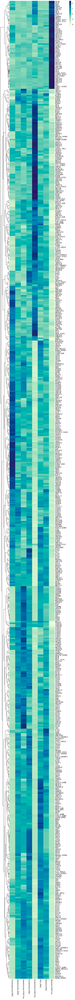

In [89]:
options(repr.plot.width=6, repr.plot.height=80)

ATAC.H3K27ac %>%
    select(motif, Cholangiocyte.ATAC=Cholangiocyte, Hepatocytes.ATAC, Hepatocytes.H3K27ac, 
          Endothelial.ATAC, Endothelial.H3K27ac, HSC.ATAC=HSC,
          Myeloid.ATAC, Myeloid.H3K27ac) %>%
    arrange(motif) %>%
    tibble::column_to_rownames('motif') %>%
    pheatmap(color = hcl.colors(100, "YlGnBu", rev=T), scale = 'row', cluster_cols = F, cluster_rows=T)#, display_numbers = full.data.lab.plot)

In [ ]:
rna.sig_label <- select(filter(full.res.rna, estimate != Inf), q.value, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = q.value)
atac.sig_label <- select(filter(full.res.atac, estimate != Inf), q.value, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = q.value)
h3k27ac.sig_label <- select(filter(full.res.h3k27ac, estimate != Inf), q.value, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = q.value)
h3k27me3.sig_label <- select(filter(full.res.h3k27me3, estimate != Inf), q.value, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = q.value)

rna.sig_label

In [252]:
RNA.ATAC <- left_join(rna.sig_label, atac.sig_label, by='motif', suffix = c('.RNA','.ATAC'))
H3K27ac.H3K27me3 <- left_join(h3k27ac.sig_label, h3k27me3.sig_label, by='motif', suffix = c('.H3K27ac','.H3K27me3'))

full.data.sig <- left_join(RNA.ATAC, H3K27ac.H3K27me3, by='motif') %>%
    tibble::column_to_rownames(var='motif')
full.data.sig

,Cholangiocyte.RNA,Endothelial.RNA,Hepatocytes.RNA,HSC.RNA,Myeloid.RNA,Cholangiocyte.ATAC,Endothelial.ATAC,Hepatocytes.ATAC,HSC.ATAC,Myeloid.ATAC,Endothelial,Hepatocytes.H3K27ac,Myeloid.H3K27ac,Cholangiocyte,Hepatocytes.H3K27me3,Myeloid.H3K27me3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HOXA6,1,1.0000000,1.0000000,1,1,1,0.6940301,0.6066893,1.0000000,0.4978642,1,1.0000000,1,1,0.66698891,1
HOXA7,1,1.0000000,1.0000000,1,1,1,0.6083208,0.5673149,1.0000000,0.8465908,1,1.0000000,1,1,0.47752148,1
HOXB6,1,1.0000000,1.0000000,1,1,1,0.7631970,0.4949629,1.0000000,0.4932332,1,0.9703866,1,1,0.47752148,1
VAX2,1,1.0000000,1.0000000,1,1,1,0.6243870,0.6705560,1.0000000,0.5726712,1,1.0000000,1,1,0.87824941,1
HOXA9,1,1.0000000,0.8668794,1,1,1,0.2626458,0.1231103,1.0000000,0.7861478,1,0.9703866,1,1,0.92941670,1
SHOX,1,1.0000000,0.9966307,1,1,1,0.4880516,0.5544805,1.0000000,0.2645659,1,1.0000000,1,1,0.54373934,1
NKX6-2,1,1.0000000,0.4333797,1,1,1,0.6316405,0.5774788,1.0000000,0.8147916,1,1.0000000,1,1,1.00000000,1
MIXL1,1,1.0000000,0.9966307,1,1,1,0.4880516,0.5408040,1.0000000,0.2964852,1,1.0000000,1,1,0.54373934,1
ALX3,1,1.0000000,0.9966307,1,1,1,0.4911718,0.5266110,1.0000000,0.2645659,1,1.0000000,1,1,0.54373934,1


In [259]:
full.data.lab <- mutate_all(full.data.sig, function(x) ifelse(x < 0.05, '*', ''))
full.data.lab

,Cholangiocyte.RNA,Endothelial.RNA,Hepatocytes.RNA,HSC.RNA,Myeloid.RNA,Cholangiocyte.ATAC,Endothelial.ATAC,Hepatocytes.ATAC,HSC.ATAC,Myeloid.ATAC,Endothelial,Hepatocytes.H3K27ac,Myeloid.H3K27ac,Cholangiocyte,Hepatocytes.H3K27me3,Myeloid.H3K27me3
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
HOXA6,,,,,,,,,,,,,,,,
HOXA7,,,,,,,,,,,,,,,,
HOXB6,,,,,,,,,,,,,,,,
VAX2,,,,,,,,,,,,,,,,
HOXA9,,,,,,,,,,,,,,,,
SHOX,,,,,,,,,,,,,,,,
NKX6-2,,,,,,,,,,,,,,,,
MIXL1,,,,,,,,,,,,,,,,
ALX3,,,,,,,,,,,,,,,,


In [262]:
display_numbers = test_labels

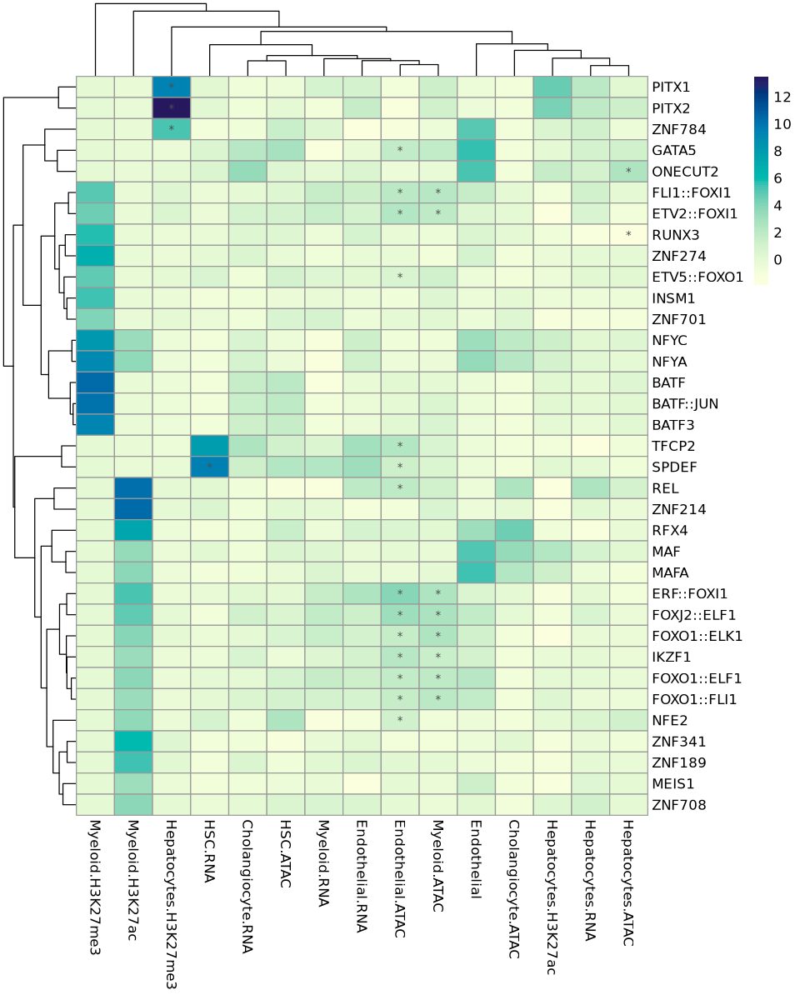

In [263]:
options(repr.plot.width=8, repr.plot.height=10)
#full.data <- select(full.data, -Cholangiocyte)
enriched_to_keep <- rownames(full.data[apply(full.data, 1, function(x) max(x)) > 10,])
    
full.data.scaled <- mutate_all(full.data, scale)
full.data.lab.plot <- full.data.lab[enriched_to_keep, colnames(full.data.scaled)]
full.data.scaled[enriched_to_keep,] %>%
    pheatmap(color = hcl.colors(100, "YlGnBu", rev=T), display_numbers = full.data.lab.plot)

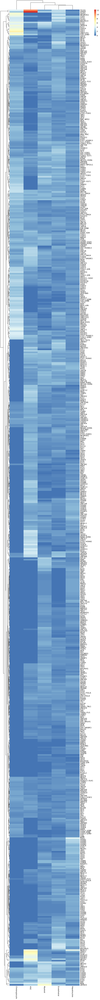

In [45]:
options(repr.plot.width=8, repr.plot.height=80)
pheatmap(select(full.res.rna, estimate, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = estimate) %>%
    tibble::column_to_rownames('motif') %>% as.matrix())

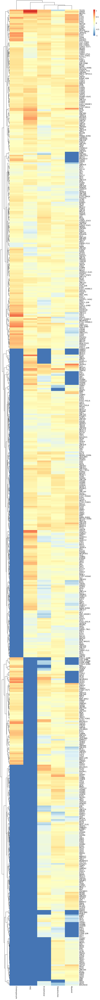

In [46]:
options(repr.plot.width=8, repr.plot.height=80)
pheatmap(select(full.res.rna, estimate, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = estimate) %>%
    tibble::column_to_rownames('motif') %>% mutate_all( ~ . + .1) %>% as.matrix() %>% log10())

In [47]:
rna.heat.data <- select(full.res.rna, estimate, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = estimate) %>%
    tibble::column_to_rownames('motif') %>% mutate_all( ~ . + .1)

head(rna.heat.data)

,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HOXA6,0.1,0.9048424,1.4618303,0.100000,0.7638478
HOXA7,0.1,0.1000000,0.7618125,0.100000,0.6877962
HOXB6,0.1,0.6980167,1.4022914,0.100000,0.6731908
VAX2,0.1,0.1000000,1.2846790,0.100000,1.2944484
HOXA9,0.1,1.2211992,1.6675347,2.593556,0.1000000
SHOX,0.1,0.1000000,1.4664989,0.100000,0.8883071


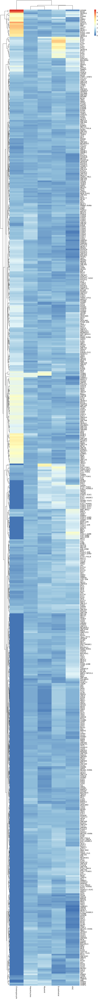

In [48]:
options(repr.plot.width=8, repr.plot.height=80)
pheatmap(select(full.res.atac, estimate, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = estimate) %>%
    tibble::column_to_rownames('motif') %>% as.matrix())

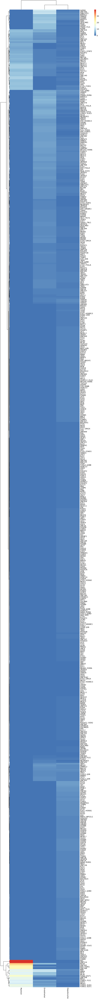

In [49]:
options(repr.plot.width=8, repr.plot.height=80)
pheatmap(select(full.res.h3k27ac, estimate, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = estimate) %>%
    tibble::column_to_rownames('motif') %>% as.matrix())

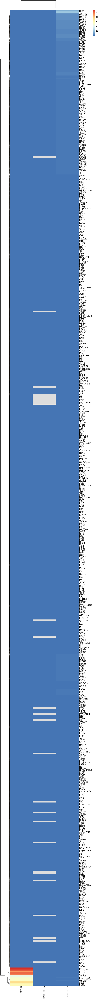

In [50]:
options(repr.plot.width=8, repr.plot.height=80)
pheatmap(select(filter(full.res.h3k27me3, estimate != Inf), estimate, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = estimate) %>%
    tibble::column_to_rownames('motif') %>% as.matrix())

In [51]:
left_join(rna.estimate, atac.estimate, by='motif', suffix = c('.RNA','.ATAC'))

motif,Cholangiocyte.RNA,Endothelial.RNA,Hepatocytes.RNA,HSC.RNA,Myeloid.RNA,Cholangiocyte.ATAC,Endothelial.ATAC,Hepatocytes.ATAC,HSC.ATAC,Myeloid.ATAC
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HOXA6,0.000000,0.8048424,1.3618303,0.0000000,0.6638478,0.000000,0.7405346,1.0410018,1.1223488,0.5525397
HOXA7,0.000000,0.0000000,0.6618125,0.0000000,0.5877962,0.000000,1.2640384,1.0780098,0.3825355,1.0077984
HOXB6,0.000000,0.5980167,1.3022914,0.0000000,0.5731908,0.000000,1.0696633,1.1432920,0.8161290,0.6119932
VAX2,0.000000,0.0000000,1.1846790,0.0000000,1.1944484,0.000000,1.3642557,0.9601142,0.7003966,0.5094851
HOXA9,0.000000,1.1211992,1.5675347,2.4935556,0.0000000,6.792293,1.6817047,1.4269246,0.4732738,0.8304265
SHOX,0.000000,0.0000000,1.3664989,0.0000000,0.7883071,0.000000,1.4330420,0.8677805,0.9845176,0.3520873
NKX6-2,0.000000,1.8443262,4.5983600,5.0872865,1.3706161,0.000000,1.2969062,0.8333351,0.0000000,0.7347231
MIXL1,0.000000,0.0000000,1.4012444,0.0000000,0.8160967,0.000000,1.4556820,0.8485701,1.0004000,0.3605455
ALX3,0.000000,0.0000000,1.3664989,0.0000000,1.5302892,0.000000,1.4024993,0.8477262,0.9691501,0.3455005


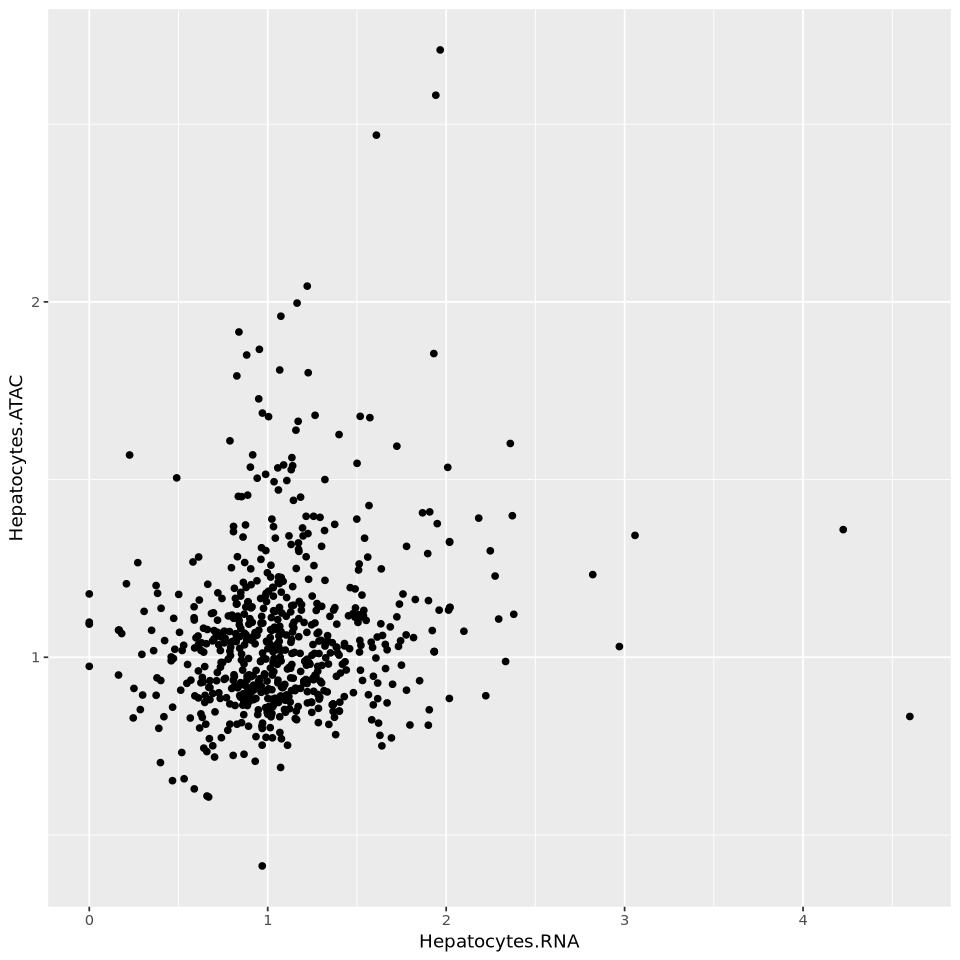

In [52]:
options(repr.plot.width=8, repr.plot.height=8)
ggplot(left_join(rna.estimate, atac.estimate, by='motif', suffix = c('.RNA','.ATAC')),
      aes(x=Hepatocytes.RNA, y=Hepatocytes.ATAC)) + geom_point()

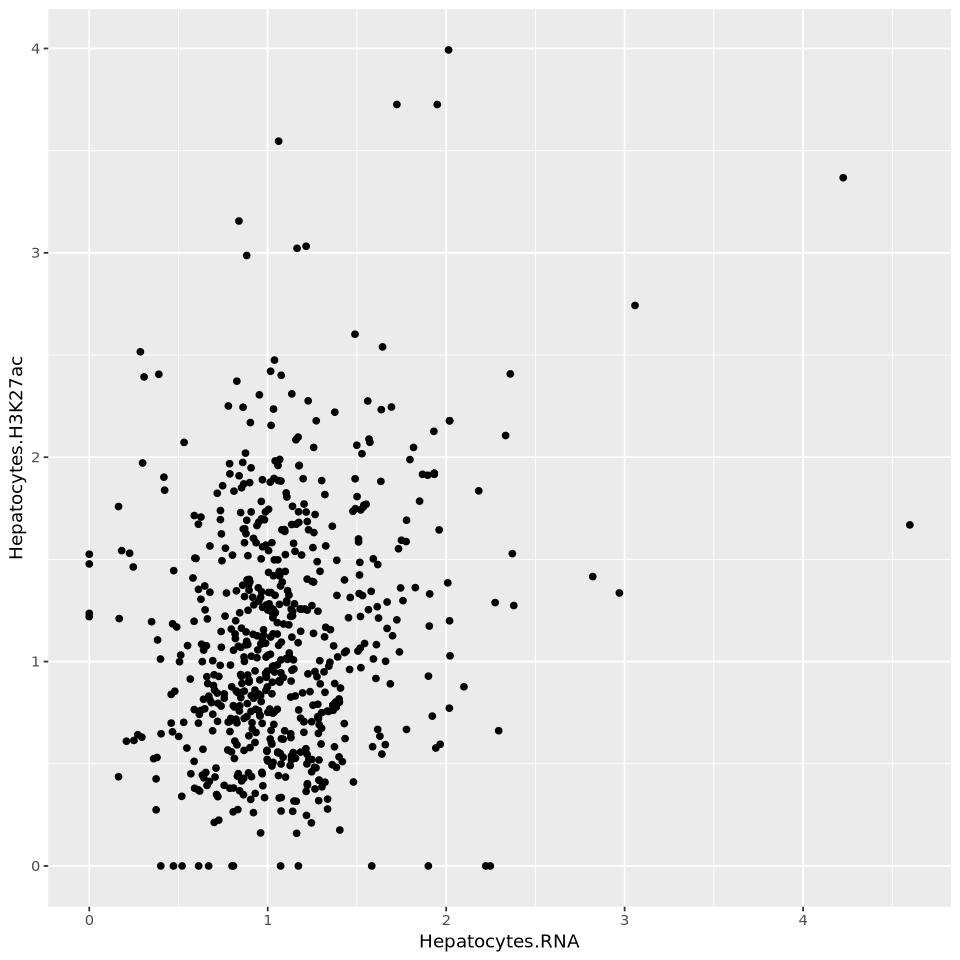

In [53]:
options(repr.plot.width=8, repr.plot.height=8)
ggplot(left_join(rna.estimate, h3k27ac.estimate, by='motif', suffix = c('.RNA','.H3K27ac')),
      aes(x=Hepatocytes.RNA, y=Hepatocytes.H3K27ac)) + geom_point()

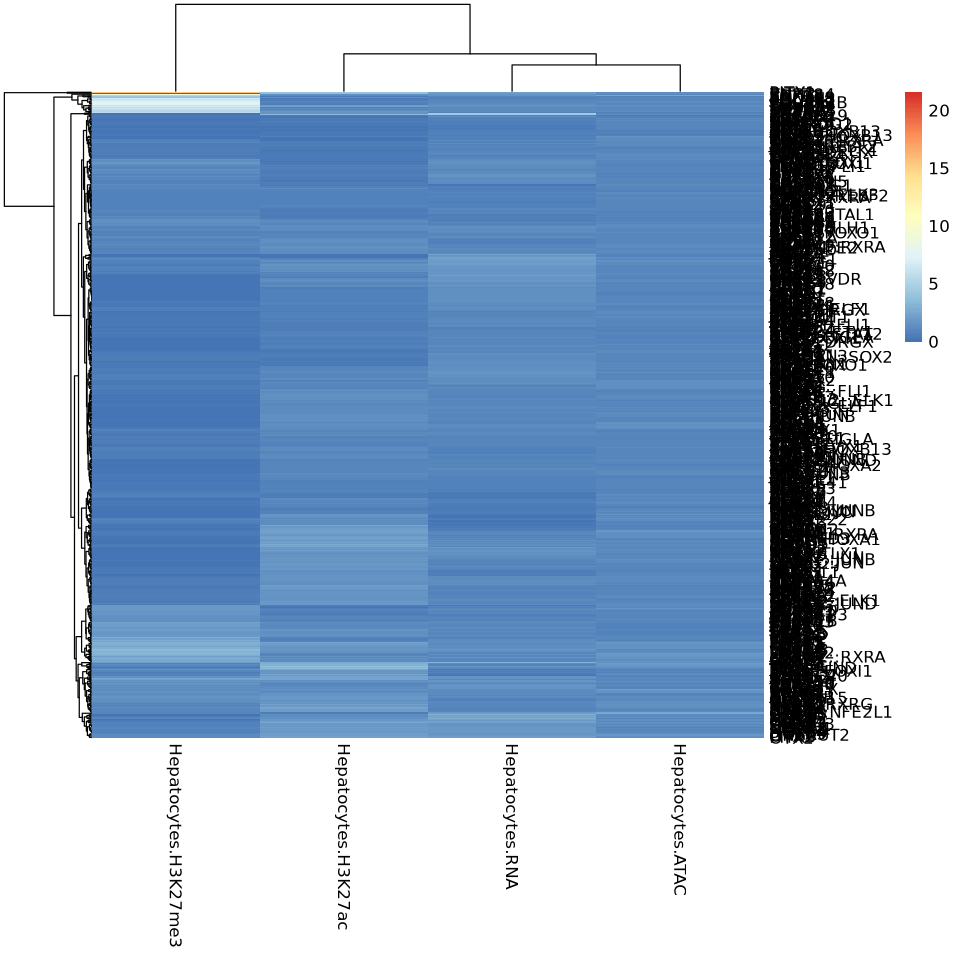

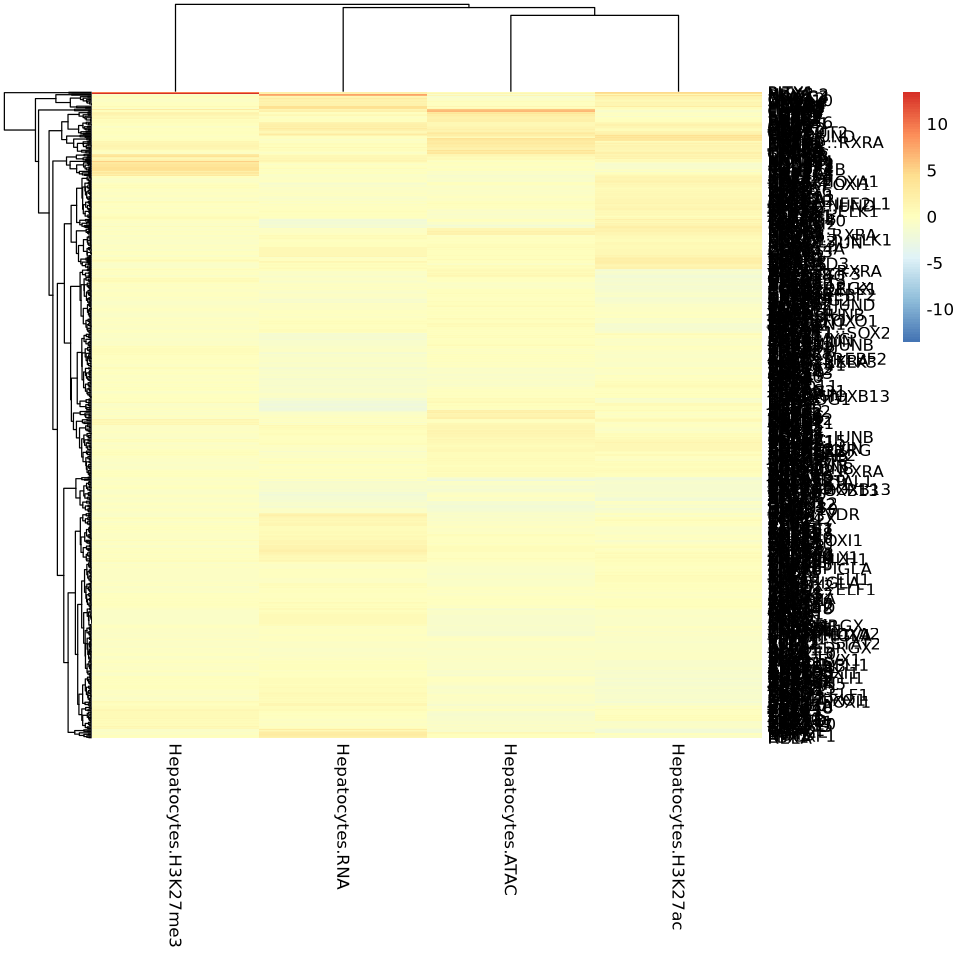

In [54]:
RNA.ATAC <- left_join(rna.estimate, atac.estimate, by='motif', suffix = c('.RNA','.ATAC'))
H3K27ac.H3K27me3 <- left_join(h3k27ac.estimate, h3k27me3.estimate, by='motif', suffix = c('.H3K27ac','.H3K27me3'))


left_join(RNA.ATAC, H3K27ac.H3K27me3, by='motif') %>%
    tibble::column_to_rownames(var='motif') %>%
    select(contains('Hep')) %>% as.matrix() %>%

pheatmap()

left_join(RNA.ATAC, H3K27ac.H3K27me3, by='motif') %>%
    tibble::column_to_rownames(var='motif') %>%
    select(contains('Hep')) %>% as.matrix() %>%
pheatmap(scale='column')

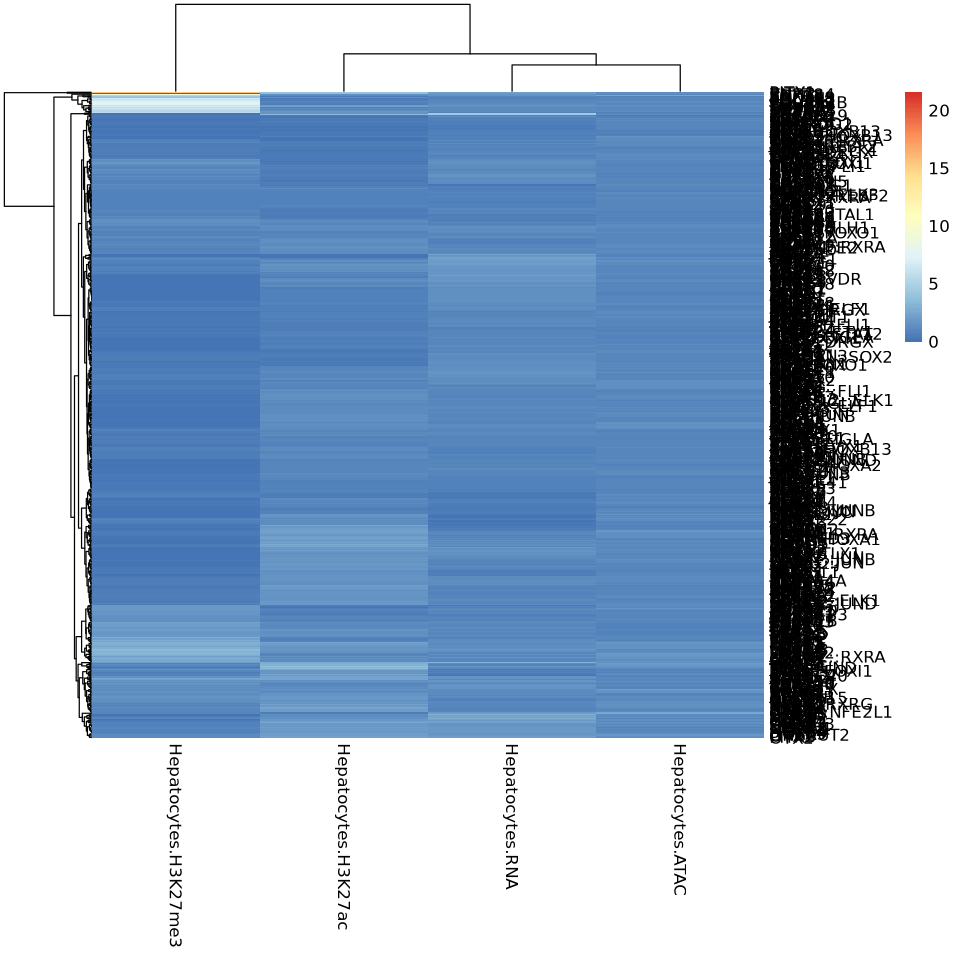

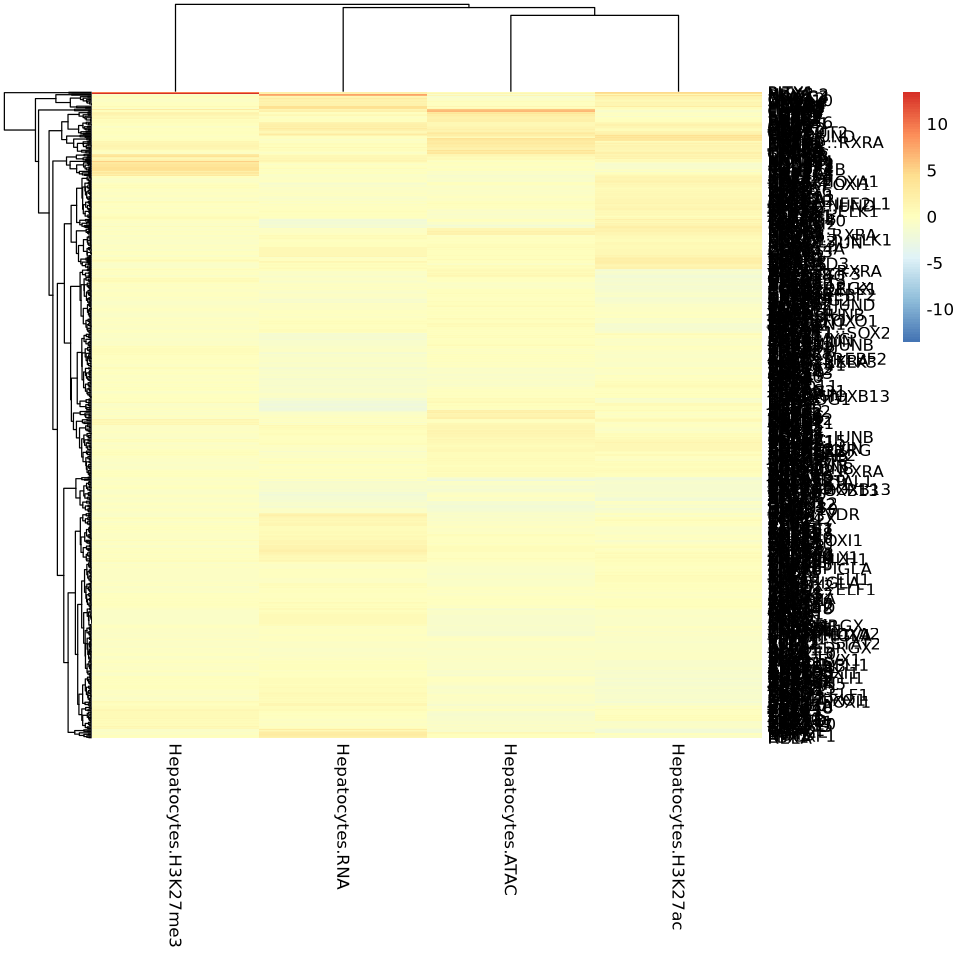

In [55]:
RNA.ATAC <- left_join(rna.estimate, atac.estimate, by='motif', suffix = c('.RNA','.ATAC'))
H3K27ac.H3K27me3 <- left_join(h3k27ac.estimate, h3k27me3.estimate, by='motif', suffix = c('.H3K27ac','.H3K27me3'))


left_join(RNA.ATAC, H3K27ac.H3K27me3, by='motif') %>%
    tibble::column_to_rownames(var='motif') %>%
    select(contains('Hep')) %>% as.matrix() %>%

pheatmap()

left_join(RNA.ATAC, H3K27ac.H3K27me3, by='motif') %>%
    tibble::column_to_rownames(var='motif') %>%
    select(contains('Hep')) %>% as.matrix() %>%
pheatmap(scale='column')

In [56]:
hep.data <- left_join(RNA.ATAC, H3K27ac.H3K27me3, by='motif') %>%
    tibble::column_to_rownames(var='motif') %>%
    select(contains('Hep'))
hep.data

,Hepatocytes.RNA,Hepatocytes.ATAC,Hepatocytes.H3K27ac,Hepatocytes.H3K27me3
,<dbl>,<dbl>,<dbl>,<dbl>
HOXA6,1.3618303,1.0410018,1.6623694,0.0000000
HOXA7,0.6618125,1.0780098,1.2088112,0.0000000
HOXB6,1.3022914,1.1432920,1.8854976,0.0000000
VAX2,1.1846790,0.9601142,1.1481535,0.0000000
HOXA9,1.5675347,1.4269246,2.0887226,1.0338460
SHOX,1.3664989,0.8677805,0.7864376,0.0000000
NKX6-2,4.5983600,0.8333351,1.6688618,0.0000000
MIXL1,1.4012444,0.8485701,0.8016103,0.0000000
ALX3,1.3664989,0.8477262,0.7614500,0.0000000


In [57]:
full.data <- left_join(RNA.ATAC, H3K27ac.H3K27me3, by='motif') %>%
    tibble::column_to_rownames(var='motif')
full.data

,Cholangiocyte.RNA,Endothelial.RNA,Hepatocytes.RNA,HSC.RNA,Myeloid.RNA,Cholangiocyte.ATAC,Endothelial.ATAC,Hepatocytes.ATAC,HSC.ATAC,Myeloid.ATAC,Endothelial,Hepatocytes.H3K27ac,Myeloid.H3K27ac,Cholangiocyte,Hepatocytes.H3K27me3,Myeloid.H3K27me3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HOXA6,0.000000,0.8048424,1.3618303,0.0000000,0.6638478,0.000000,0.7405346,1.0410018,1.1223488,0.5525397,0.000000,1.6623694,0,0,0.0000000,0
HOXA7,0.000000,0.0000000,0.6618125,0.0000000,0.5877962,0.000000,1.2640384,1.0780098,0.3825355,1.0077984,0.000000,1.2088112,0,0,0.0000000,0
HOXB6,0.000000,0.5980167,1.3022914,0.0000000,0.5731908,0.000000,1.0696633,1.1432920,0.8161290,0.6119932,0.000000,1.8854976,0,0,0.0000000,0
VAX2,0.000000,0.0000000,1.1846790,0.0000000,1.1944484,0.000000,1.3642557,0.9601142,0.7003966,0.5094851,0.000000,1.1481535,0,0,0.0000000,0
HOXA9,0.000000,1.1211992,1.5675347,2.4935556,0.0000000,6.792293,1.6817047,1.4269246,0.4732738,0.8304265,7.685834,2.0887226,0,0,1.0338460,0
SHOX,0.000000,0.0000000,1.3664989,0.0000000,0.7883071,0.000000,1.4330420,0.8677805,0.9845176,0.3520873,0.000000,0.7864376,0,0,0.0000000,0
NKX6-2,0.000000,1.8443262,4.5983600,5.0872865,1.3706161,0.000000,1.2969062,0.8333351,0.0000000,0.7347231,0.000000,1.6688618,0,0,0.0000000,0
MIXL1,0.000000,0.0000000,1.4012444,0.0000000,0.8160967,0.000000,1.4556820,0.8485701,1.0004000,0.3605455,0.000000,0.8016103,0,0,0.0000000,0
ALX3,0.000000,0.0000000,1.3664989,0.0000000,1.5302892,0.000000,1.4024993,0.8477262,0.9691501,0.3455005,0.000000,0.7614500,0,0,0.0000000,0


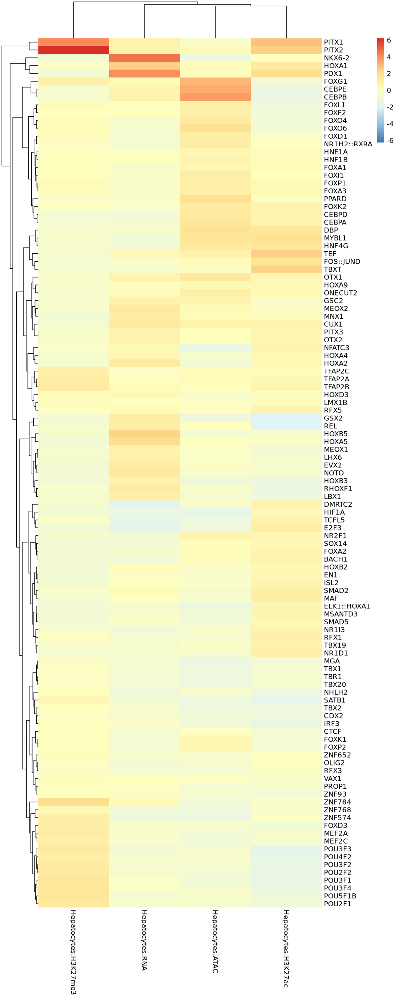

In [58]:
options(repr.plot.width=8, repr.plot.height=20)
enriched_to_keep <- rownames(hep.data[apply(hep.data, 1, function(x) max(x)) > 2,])
hep.data[enriched_to_keep,] %>%
    pheatmap(scale='column')

In [65]:
rna.sig_label <- select(filter(full.res.rna, estimate != Inf), q.value, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = q.value)
atac.sig_label <- select(filter(full.res.atac, estimate != Inf), q.value, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = q.value)
h3k27ac.sig_label <- select(filter(full.res.h3k27ac, estimate != Inf), q.value, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = q.value)
h3k27me3.sig_label <- select(filter(full.res.h3k27me3, estimate != Inf), q.value, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = q.value)

rna.sig_label

motif,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HOXA6,1,1.0000000,1.0000000,1,1
HOXA7,1,1.0000000,1.0000000,1,1
HOXB6,1,1.0000000,1.0000000,1,1
VAX2,1,1.0000000,1.0000000,1,1
HOXA9,1,1.0000000,0.8668794,1,1
SHOX,1,1.0000000,0.9966307,1,1
NKX6-2,1,1.0000000,0.4333797,1,1
MIXL1,1,1.0000000,0.9966307,1,1
ALX3,1,1.0000000,0.9966307,1,1


In [66]:
RNA.ATAC <- left_join(rna.sig_label, atac.sig_label, by='motif', suffix = c('.RNA','.ATAC'))
H3K27ac.H3K27me3 <- left_join(h3k27ac.sig_label, h3k27me3.sig_label, by='motif', suffix = c('.H3K27ac','.H3K27me3'))

full.data.sig <- left_join(RNA.ATAC, H3K27ac.H3K27me3, by='motif') %>%
    tibble::column_to_rownames(var='motif')
full.data.sig

,Cholangiocyte.RNA,Endothelial.RNA,Hepatocytes.RNA,HSC.RNA,Myeloid.RNA,Cholangiocyte.ATAC,Endothelial.ATAC,Hepatocytes.ATAC,HSC.ATAC,Myeloid.ATAC,Endothelial,Hepatocytes.H3K27ac,Myeloid.H3K27ac,Cholangiocyte,Hepatocytes.H3K27me3,Myeloid.H3K27me3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HOXA6,1,1.0000000,1.0000000,1,1,1,0.6940301,0.6066893,1.0000000,0.4978642,1,1.0000000,1,1,0.66698891,1
HOXA7,1,1.0000000,1.0000000,1,1,1,0.6083208,0.5673149,1.0000000,0.8465908,1,1.0000000,1,1,0.47752148,1
HOXB6,1,1.0000000,1.0000000,1,1,1,0.7631970,0.4949629,1.0000000,0.4932332,1,0.9703866,1,1,0.47752148,1
VAX2,1,1.0000000,1.0000000,1,1,1,0.6243870,0.6705560,1.0000000,0.5726712,1,1.0000000,1,1,0.87824941,1
HOXA9,1,1.0000000,0.8668794,1,1,1,0.2626458,0.1231103,1.0000000,0.7861478,1,0.9703866,1,1,0.92941670,1
SHOX,1,1.0000000,0.9966307,1,1,1,0.4880516,0.5544805,1.0000000,0.2645659,1,1.0000000,1,1,0.54373934,1
NKX6-2,1,1.0000000,0.4333797,1,1,1,0.6316405,0.5774788,1.0000000,0.8147916,1,1.0000000,1,1,1.00000000,1
MIXL1,1,1.0000000,0.9966307,1,1,1,0.4880516,0.5408040,1.0000000,0.2964852,1,1.0000000,1,1,0.54373934,1
ALX3,1,1.0000000,0.9966307,1,1,1,0.4911718,0.5266110,1.0000000,0.2645659,1,1.0000000,1,1,0.54373934,1


In [67]:
full.data.lab <- mutate_all(full.data.sig, function(x) ifelse(x < 0.05, '*', ''))
full.data.lab

,Cholangiocyte.RNA,Endothelial.RNA,Hepatocytes.RNA,HSC.RNA,Myeloid.RNA,Cholangiocyte.ATAC,Endothelial.ATAC,Hepatocytes.ATAC,HSC.ATAC,Myeloid.ATAC,Endothelial,Hepatocytes.H3K27ac,Myeloid.H3K27ac,Cholangiocyte,Hepatocytes.H3K27me3,Myeloid.H3K27me3
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
HOXA6,,,,,,,,,,,,,,,,
HOXA7,,,,,,,,,,,,,,,,
HOXB6,,,,,,,,,,,,,,,,
VAX2,,,,,,,,,,,,,,,,
HOXA9,,,,,,,,,,,,,,,,
SHOX,,,,,,,,,,,,,,,,
NKX6-2,,,,,,,,,,,,,,,,
MIXL1,,,,,,,,,,,,,,,,
ALX3,,,,,,,,,,,,,,,,


In [68]:
display_numbers = test_labels

ERROR: Error in eval(expr, envir, enclos): object 'test_labels' not found


In [70]:
rownames(full.data.lab[apply(full.data.lab, 1, function(x) any(x=='*')),])

[1] "VAX1"         "SRY"          "NR2C2"        "GSC2"         "OTX1"        
  [6] "SOX18"        "NR2C1"        "ERF::FOXI1"   "FOSL1::JUND"  "TFAP2A"      
 [11] "TFAP2B"       "KLF2"         "TBX2"         "TFAP2C"       "FOXP3"       
 [16] "POU5F1B"      "ETV7"         "FOXC1"        "FOXL1"        "FOXO4"       
 [21] "ETV4"         "GATA5"        "TFCP2"        "SOX2"         "SNAI1"       
 [26] "GATA2"        "ETS1"         "SOX13"        "RORB"         "FOXJ2::ELF1" 
 [31] "PITX1"        "FOXC2"        "HOXD3"        "POU2F1"       "NR4A2"       
 [36] "FOXP1"        "FOS::JUN"     "PLAGL2"       "FOXA2"        "ETV5::FOXO1" 
 [41] "POU3F1"       "FOXI1"        "ZNF784"       "RBPJ"         "ETV6"        
 [46] "FOXO6"        "SP8"          "FOXK2"        "RUNX3"        "TRPS1"       
 [51] "ERF"          "NA"           "KLF5"         "ONECUT2"      "FOXD1"       
 [56] "PITX2"        "FOXA3"        "REL"          "SOX14"        "ZBTB7A"      
 [61] "ELK4"         "GATA4"        "ETS2"         "ELF2"         "GATA6"       
 [66] "CUX1"         "FLI1"         "FOXA1"        "IKZF1"        "NR2F1"       
 [71] "ETV1"         "KLF7"         "FLI1::FOXI1"  "NR4A1"        "TBX1"        
 [76] "ERF::FOXO1"   "DBP"          "ELF3"         "EHF"          "FOXK1"       
 [81] "CEBPD"        "THAP1"        "KLF14"        "FOXD3"        "GABPA"       
 [86] "ETV2::FOXI1"  "ETV2::DRGX"   "MEF2A"        "DUXA"         "SNAI3"       
 [91] "FOXH1"        "ETV5::DRGX"   "MEF2C"        "SP2"          "POU4F1"      
 [96] "ETV3"         "CEBPA"        "FOXP2"        "POU3F2"       "ETV5::HOXA2" 
[101] "SATB1"        "POU3F4"       "FOXG1"        "ELF1"         "NFIL3"       
[106] "KLF3"         "HLF"          "SNAI2"        "KLF10"        "SP3"         
[111] "ELK3"         "SPDEF"        "PATZ1"        "POU3F3"       "ZNF768"      
[116] "CREB1"        "ETV2"         "ETV5"         "SP4"          "PAX3"        
[121] "LMX1B"        "BACH1"        "CEBPG"        "IRF6"         "SPIC"        
[126] "TEF"          "ZNF574"       "ELK1"         "FOXF2"        "SP1"         
[131] "FEV"          "DUX4"         "KLF15"        "PBX1"         "KLF12"       
[136] "ZNF652"       "ZNF148"       "ZNF610"       "ZSCAN29"      "FOXO1::ELK1" 
[141] "THRB"         "EGR4"         "NA.1"         "PROP1"        "ZNF740"      
[146] "SPIB"         "CTCF"         "MYBL1"        "HNF4G"        "STAT1::STAT2"
[151] "MYBL2"        "NFKB2"        "CEBPE"        "FOXO1::ELK3"  "ELF4"        
[156] "HNF4A"        "CEBPB"        "HNF1A"        "TCF7L1"       "FOXO1::ELF1" 
[161] "HOXB2::ELK1"  "HNF1B"        "NA.2"         "ELK1::HOXA1"  "KLF17"       
[166] "NFE2"         "RXRG"         "PPARA::RXRA"  "NA.3"         "FOXN3"       
[171] "NHLH2"        "RXRB"         "ETV5::FOXI1"  "ZNF354A"      "ERF::FIGLA"  
[176] "POU2F2"       "EGR3"         "ELK1::HOXB13" "FOXO1::FLI1"  "ELK1::SREBF2"
[181] "IRF2"         "ZNF136"       "PPARD"        "POU4F2"       "IRF3"        
[186] "NR1H2::RXRA"

In [71]:
rownames(full.data[apply(full.data, 1, function(x) max(x)) > 10,])

[1] "NA"          "NA.1"        "NA.2"        "GATA5"       "TFCP2"      
 [6] "NA.3"        "NA.4"        "PITX1"       "ETV5::FOXO1" "BATF"       
[11] "ZNF784"      "NA.5"        "RUNX3"       "NA.6"        "NA.7"       
[16] "BATF::JUN"   "ONECUT2"     "PITX2"       "REL"         "NA.8"       
[21] "BATF3"       "NA.9"        "NA.10"       "NA.11"       "NA.12"      
[26] "ZNF341"      "IKZF1"       "FLI1::FOXI1" "NFYC"        "ZNF214"     
[31] "NFYA"        "ETV2::FOXI1" "MAF"         "NA.13"       "INSM1"      
[36] "MEIS1"       "MAFA"        "NA.14"       "SPDEF"       "NA.15"      
[41] "NA.16"       "NA.17"       "NA.18"       "NA.19"       "ZNF189"     
[46] "FOXO1::ELK1" "NA.20"       "ZNF708"      "ZNF274"      "NA.21"      
[51] "ZNF701"      "FOXO1::ELF1" "NA.22"       "NA.23"       "NFE2"       
[56] "NA.24"       "NA.25"       "FOXO1::FLI1" "NA.26"       "RFX4"

In [73]:
atac.labs <- atac.sig_label %>%
    tibble::column_to_rownames(var='motif')
    #mutate_all(function(x) ifelse(x < 0.05, '*', ''))
atac.labs.sig <- atac.labs[rowSums(atac.labs < 0.05) > 0,]
atac.labs.sig.star <- mutate_all(atac.labs.sig, function(x) ifelse(x < 0.05, '*', ''))

atac.estimate.sig <- atac.estimate %>%
    tibble::column_to_rownames(var='motif')
atac.estimate.sig <- atac.estimate.sig[rownames(atac.labs.sig),]

atac.labs.sig
atac.labs.sig.star
atac.estimate.sig

,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRY,1,6.243870e-01,2.769270e-02,0.4214790,8.419054e-01
NR2C2,1,4.880516e-01,6.871364e-07,1.0000000,5.791784e-01
GSC2,1,1.993757e-01,8.763150e-03,1.0000000,7.335625e-01
OTX1,1,2.112800e-01,6.197390e-04,1.0000000,7.461701e-01
SOX18,1,6.243870e-01,1.100239e-02,1.0000000,3.322318e-01
NR2C1,1,1.634639e-01,1.408335e-02,1.0000000,7.794438e-01
ERF::FOXI1,1,1.000000e-17,3.426220e-01,1.0000000,6.593479e-06
FOSL1::JUND,1,1.748523e-02,5.098604e-01,0.3555951,4.786275e-01
TFAP2A,1,1.142014e-01,2.867714e-04,1.0000000,7.794438e-01


,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid
,<chr>,<chr>,<chr>,<chr>,<chr>
SRY,,,*,,
NR2C2,,,*,,
GSC2,,,*,,
OTX1,,,*,,
SOX18,,,*,,
NR2C1,,,*,,
ERF::FOXI1,,*,,,*
FOSL1::JUND,,*,,,
TFAP2A,,,*,,


,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRY,3.2121072,1.1642485,1.3121789,1.8855806,0.9369088
NR2C2,0.5157537,1.1777085,1.4706542,1.1520954,1.1364619
GSC2,0.0000000,0.4474026,1.5343673,0.6407506,0.8090540
OTX1,0.0000000,0.3493635,1.8545627,0.5082093,1.1333620
SOX18,2.7836725,1.1859450,1.3966475,1.2952704,0.6582971
NR2C1,1.6182808,1.5300821,1.4519216,1.2347364,1.0741479
ERF::FOXI1,1.0354105,3.2326771,0.8453131,1.1821773,2.0831405
FOSL1::JUND,0.0000000,1.7644731,1.0948246,2.1451226,0.7207562
TFAP2A,0.6307607,1.3568152,1.3887134,1.2325131,1.0439598


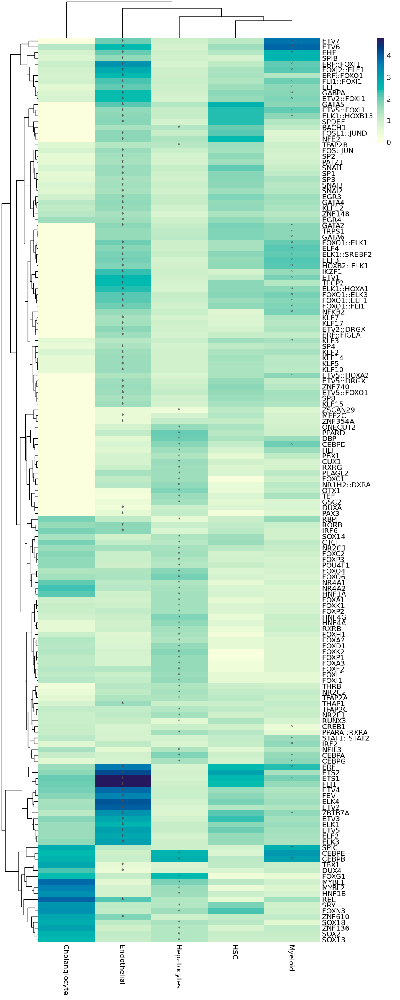

In [74]:
options(repr.plot.width=8, repr.plot.height=20)
pheatmap(atac.estimate.sig, color = hcl.colors(100, "YlGnBu", rev=T), display_numbers = atac.labs.sig.star,)

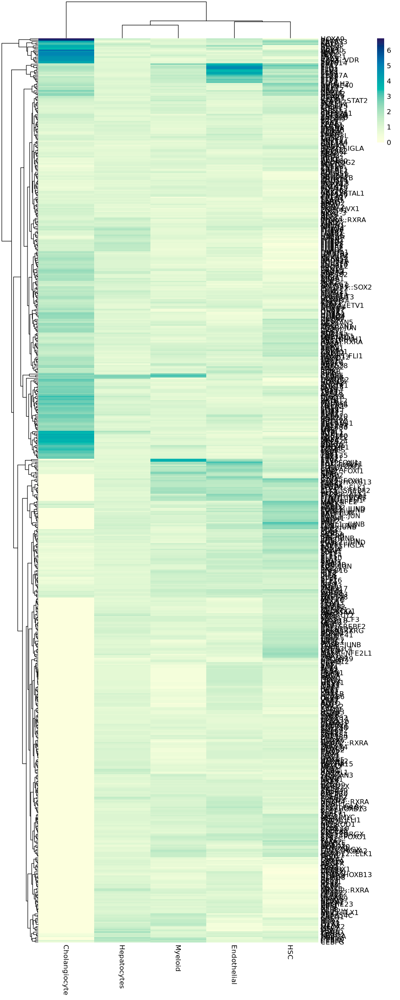

In [87]:
options(repr.plot.width=8, repr.plot.height=20)
pheatmap(tibble::column_to_rownames(atac.estimate, var='motif'), color = hcl.colors(100, "YlGnBu", rev=T))

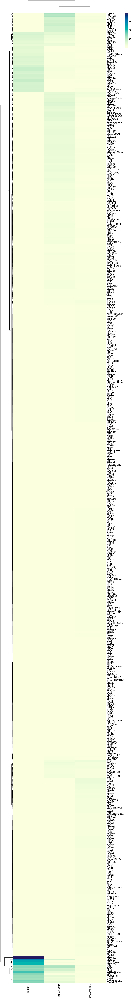

In [86]:
options(repr.plot.width=8, repr.plot.height=60)
pheatmap(tibble::column_to_rownames(h3k27ac.estimate, var='motif'), color = hcl.colors(100, "YlGnBu", rev=T))

In [81]:
atac.labs <- atac.sig_label %>%
    tibble::column_to_rownames(var='motif')
    #mutate_all(function(x) ifelse(x < 0.05, '*', ''))
atac.labs.sig <- atac.labs[rowSums(atac.labs < 0.05) > 0,]
atac.labs.sig.star <- mutate_all(atac.labs.sig, function(x) ifelse(x < 0.05, '*', ''))

atac.estimate.sig <- atac.estimate %>%
    tibble::column_to_rownames(var='motif')
atac.estimate.sig <- atac.estimate.sig[rownames(atac.labs.sig),]

atac.labs.sig
atac.labs.sig.star
atac.estimate.sig

motif,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HOXA6,0.000000,0.7405346,1.0410018,1.1223488,0.5525397
HOXA7,0.000000,1.2640384,1.0780098,0.3825355,1.0077984
HOXB6,0.000000,1.0696633,1.1432920,0.8161290,0.6119932
VAX2,0.000000,1.3642557,0.9601142,0.7003966,0.5094851
HOXA9,6.792293,1.6817047,1.4269246,0.4732738,0.8304265
SHOX,0.000000,1.4330420,0.8677805,0.9845176,0.3520873
NKX6-2,0.000000,1.2969062,0.8333351,0.0000000,0.7347231
MIXL1,0.000000,1.4556820,0.8485701,1.0004000,0.3605455
ALX3,0.000000,1.4024993,0.8477262,0.9691501,0.3455005


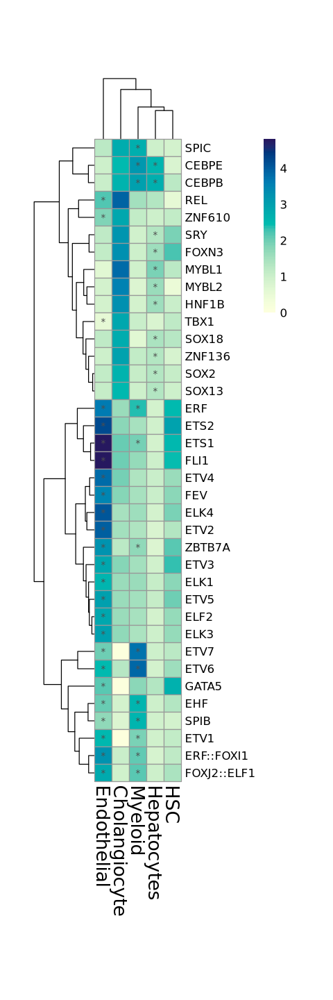

In [29]:
options(repr.plot.width=4, repr.plot.height=12)
#pdf('/nfs/lab/welison/Liver/Plots/241212_WE_ATAC_MotifbreakR_sig_2.5_enrichment.pdf', height=6, width=9)
atac.estimate.sig_2.5 <- atac.estimate.sig[rowSums(atac.estimate.sig > 2.5) > 0,]
pheatmap(atac.estimate.sig_2.5, color = hcl.colors(100, "YlGnBu", rev=T), display_numbers = atac.labs.sig.star[rownames(atac.estimate.sig_2.5),],
         cellwidth=15, cellheight=15, fontsize_col=16)
pheatmap(atac.estimate.sig_2.5, color = hcl.colors(100, "YlGnBu", rev=T), display_numbers = atac.labs.sig.star[rownames(atac.estimate.sig_2.5),], filename = '/nfs/lab/welison/Liver/Plots/241212_WE_ATAC_MotifbreakR_sig_2.5_enrichment.pdf', 
         cellwidth=15, cellheight=15, fontsize_col=16)
#dev.off()

In [20]:
?pheatmap

In [23]:
dev.list()

png 
  2

In [340]:
atac.estimate.sig[rowSums(atac.estimate.sig > 2.5) > 0,]

,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
SRY,3.2121072,1.1642485,1.3121789,1.8855806,0.9369088
SOX18,2.7836725,1.1859450,1.3966475,1.2952704,0.6582971
ERF::FOXI1,1.0354105,3.2326771,0.8453131,1.1821773,2.0831405
ETV7,0.0000000,1.9903865,0.9641326,1.2322798,3.7076359
ETV4,1.9517005,3.8233139,1.0315870,1.5931460,1.3749638
GATA5,0.0000000,2.1346149,1.3350471,2.6547290,1.7772748
SOX2,2.6190826,1.1469003,1.3416158,1.0737851,1.0674365
ETS1,2.0544213,4.8066565,0.9091258,2.5228096,1.9620504
SOX13,2.5033224,1.1048672,1.3352192,0.9949870,0.9874569


In [336]:
rowSums(atac.estimate.sig >2)

SRY        NR2C2         GSC2         OTX1        SOX18        NR2C1 
           1            0            0            0            1            0 
  ERF::FOXI1  FOSL1::JUND       TFAP2A       TFAP2B         KLF2       TFAP2C 
           2            1            0            0            0            0 
       FOXP3         ETV7        FOXC1        FOXL1        FOXO4         ETV4 
           0            1            0            0            0            1 
       GATA5        TFCP2         SOX2        SNAI1        GATA2         ETS1 
           2            1            1            1            0            3 
       SOX13         RORB  FOXJ2::ELF1        FOXC2        NR4A2        FOXP1 
           1            0            2            0            1            0 
    FOS::JUN       PLAGL2        FOXA2  ETV5::FOXO1        FOXI1         RBPJ 
           0            0            0            0            0            0 
        ETV6        FOXO6          SP8        FOXK2        RUNX3        TRPS1 
           2            0            0            0            0            0 
         ERF         KLF5      ONECUT2        FOXD1        FOXA3          REL 
           3            0            0            0            0            2 
       SOX14       ZBTB7A         ELK4        GATA4         ETS2         ELF2 
           0            2            1            0            2            1 
       GATA6         CUX1         FLI1        FOXA1        IKZF1        NR2F1 
           0            0            2            0            1            0 
        ETV1         KLF7  FLI1::FOXI1        NR4A1         TBX1   ERF::FOXO1 
           1            0            1            1            1            1 
         DBP         ELF3          EHF        FOXK1        CEBPD        THAP1 
           0            1            2            0            1            0 
       KLF14        GABPA  ETV2::FOXI1   ETV2::DRGX         DUXA        SNAI3 
           0            1            1            0            0            0 
       FOXH1   ETV5::DRGX        MEF2C          SP2       POU4F1         ETV3 
           0            0            0            0            0            2 
       CEBPA        FOXP2  ETV5::HOXA2        FOXG1         ELF1        NFIL3 
           0            0            0            2            1            0 
        KLF3          HLF        SNAI2        KLF10          SP3         ELK3 
           0            0            0            0            0            1 
       SPDEF        PATZ1        CREB1         ETV2         ETV5          SP4 
           1            0            0            1            1            0 
        PAX3        BACH1        CEBPG         IRF6         SPIC          TEF 
           0            1            0            0            2            0 
        ELK1        FOXF2          SP1          FEV         DUX4        KLF15 
           1            0            0            1            1            0 
        PBX1        KLF12       ZNF148       ZNF610      ZSCAN29  FOXO1::ELK1 
           0            0            0            1            0            1 
        THRB         EGR4       ZNF740         SPIB         CTCF        MYBL1 
           0            0            0            1            0            1 
       HNF4G STAT1::STAT2        MYBL2        NFKB2        CEBPE  FOXO1::ELK3 
           0            0            1            0            3            1 
        ELF4        HNF4A        CEBPB        HNF1A  FOXO1::ELF1  HOXB2::ELK1 
           1            0            3            1            1            1 
       HNF1B  ELK1::HOXA1        KLF17         NFE2         RXRG  PPARA::RXRA 
           1            1            0            1            0            0 
       FOXN3         RXRB  ETV5::FOXI1      ZNF354A   ERF::FIGLA         EGR3 
           2            0            2            0            0            0 
ELK1::HOXB13  FOXO1::FLI1 ELK1::SREBF2         IRF2       Z

In [129]:
arrange(full.res, q.value)

estimate,p.value,conf.low,conf.high,method,alternative,cell,motif,q.value
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
12.379193,0.000003886681,4.690023,27.735079,Fisher's Exact Test for Count Data,two.sided,HSC,SPDEF,0.002506909
10.467595,0.000191532467,3.216933,26.551906,Fisher's Exact Test for Count Data,two.sided,HSC,TFCP2,0.061769221
4.639564,0.001285655055,1.788568,10.149095,Fisher's Exact Test for Count Data,two.sided,HSC,POU4F3,0.201195458
4.478161,0.001559654713,1.727219,9.793316,Fisher's Exact Test for Count Data,two.sided,HSC,POU4F1,0.201195458
5.603663,0.001101177544,1.970185,12.985502,Fisher's Exact Test for Count Data,two.sided,HSC,NR1D1,0.201195458
3.744147,0.000365922851,1.804639,7.018147,Fisher's Exact Test for Count Data,two.sided,Myeloid,ERF,0.236020239
3.926258,0.001653503957,1.631244,8.163186,Fisher's Exact Test for Count Data,two.sided,Myeloid,ETS1,0.266627513
4.685262,0.001244130173,1.800446,10.299152,Fisher's Exact Test for Count Data,two.sided,Myeloid,MYB,0.266627513
3.577361,0.001601685331,1.579376,7.126510,Fisher's Exact Test for Count Data,two.sided,Myeloid,ETS2,0.266627513


In [140]:
select(full.res, estimate, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = estimate) %>%
    tibble::column_to_rownames('motif') %>% as.matrix()

,Cholangiocyte,Endothelial,Hepatocytes,HSC,Myeloid
HOXA6,0.000000,0.8048424,1.3618303,0.0000000,0.6638478
HOXA7,0.000000,0.0000000,0.6618125,0.0000000,0.5877962
HOXB6,0.000000,0.5980167,1.3022914,0.0000000,0.5731908
VAX2,0.000000,0.0000000,1.1846790,0.0000000,1.1944484
HOXA9,0.000000,1.1211992,1.5675347,2.4935556,0.0000000
SHOX,0.000000,0.0000000,1.3664989,0.0000000,0.7883071
NKX6-2,0.000000,1.8443262,4.5983600,5.0872865,1.3706161
MIXL1,0.000000,0.0000000,1.4012444,0.0000000,0.8160967
ALX3,0.000000,0.0000000,1.3664989,0.0000000,1.5302892
RAX2,0.000000,0.0000000,1.3664989,0.0000000,0.7883071


In [130]:
library(pheatmap)

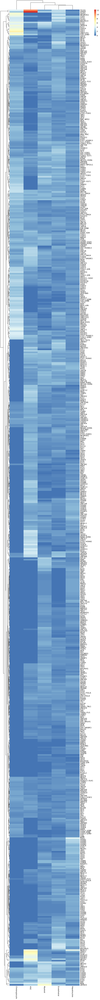

In [146]:
options(repr.plot.width=8, repr.plot.height=80)
pheatmap(select(full.res, estimate, cell, motif) %>%
    pivot_wider(names_from = cell, values_from = estimate) %>%
    tibble::column_to_rownames('motif') %>% as.matrix())

In [148]:
leadvars = vroom('../caQTLs_rasqual/Summary_allCells_leads_run1F.tsv')

dim(leadvars)
head(leadvars)

Rows: 773267 Columns: 34
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (7): Feature, rsID, Chromosome, Ref, Alt, cell, feature_snp
dbl (22): position, Af, HWEChi_square, IA, Log10_qval, Chi_square, Effect_si...
lgl  (5): flag_fdr10, flag_fdr05, flag_fdr01, exclude, qtl

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 773267     34

Feature,rsID,Chromosome,position,Ref,Alt,Af,HWEChi_square,IA,Log10_qval,⋯,r2_rSNP,P_VAl,dist,flag_fdr10,flag_fdr05,flag_fdr01,cell,exclude,qtl,feature_snp
<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<lgl>,<chr>,<lgl>,<lgl>,<chr>
chr6:32622377-32623439,chr6:32620608:T:A,chr6,32620608,T,A,0.425926,2.231991,0.998678,-67.03611,⋯,0.824496,8.976233e-71,-2300,TRUE,TRUE,TRUE,acinar,FALSE,TRUE,chr6:32622377-32623439_chr6:32620608:T:A
chr9:6931452-6932441,chr9:6929401:T:A,chr9,6929401,T,A,0.333333,0.750000,0.993936,-36.60879,⋯,0.985795,1.925609e-38,-2545,TRUE,TRUE,TRUE,acinar,FALSE,TRUE,chr9:6931452-6932441_chr9:6929401:T:A
chr4:7164816-7165698,chr4:7160692:T:C,chr4,7160692,T,C,0.277778,0.006391,0.999935,-32.46831,⋯,0.902371,1.502522e-34,-4565,TRUE,TRUE,TRUE,acinar,FALSE,TRUE,chr4:7164816-7165698_chr4:7160692:T:C
chr9:93230239-93231938,chr9:93231475:G:A,chr9,93231475,G,A,0.222222,0.137755,0.999392,-30.83427,⋯,0.992117,3.105136e-32,387,TRUE,TRUE,TRUE,acinar,FALSE,TRUE,chr9:93230239-93231938_chr9:93231475:G:A
chr17:76968760-76970675,chr17:76972946:C:A,chr17,76972946,C,A,0.296296,0.337734,0.980182,-29.73370,⋯,0.940828,4.969777e-32,3228,TRUE,TRUE,TRUE,acinar,FALSE,TRUE,chr17:76968760-76970675_chr17:76972946:C:A
chr21:13979625-13980808,chr21:13980560:G:C,chr21,13980560,G,C,0.314815,0.083599,0.930667,-27.70426,⋯,0.870565,7.793799e-30,344,TRUE,TRUE,TRUE,acinar,FALSE,TRUE,chr21:13979625-13980808_chr21:13980560:G:C


In [189]:
motifs$disrupted <- TRUE
motifs_wide <- select(motifs, SNP_id, geneSymbol, disrupted) %>%
    group_by(SNP_id) %>%
    pivot_wider(names_from=geneSymbol, values_from=disrupted, values_fill=FALSE)

full.res <- data.frame()

for (c in c('beta','alpha','acinar', 'ductal', 'delta','gamma')) {
    ct_lead <- filter(leadvars, cell == c)
    ct_lead_motif <- left_join(ct_lead, motifs_wide, join_by(rsID==SNP_id))
    ct_lead_motif <- filter(ct_lead_motif, !is.na(ISL2))
    
    ct.res <- data.frame()
    for (test.motif in colnames(motifs_wide)[2:ncol(motifs_wide)]) {
        test.res <- broom::tidy(fisher.test(table(ct_lead_motif[c('flag_fdr05', test.motif)])))
        test.res$cell <- c
        test.res$motif <- test.motif
        ct.res <- rbind(ct.res, test.res)
    }
    
    ct.res[ct.res$p.value > 1,]$p.value <- 1
    ct.res[ct.res$p.value < 0,]$p.value <- 0
    ct.res$q.value <- qvalue(ct.res$p.value)$qvalues
    ct.res <- arrange(ct.res, q.value)
    
    full.res <- rbind(full.res, ct.res)
}

dim(full.res)
head(full.res)

[1] 3870    9

estimate,p.value,conf.low,conf.high,method,alternative,cell,motif,q.value
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
4.420757,8.699078e-43,3.592280,5.436096,Fisher's Exact Test for Count Data,two.sided,beta,FOS::JUND,4.557432e-40
4.510413,1.753994e-40,3.631527,5.597729,Fisher's Exact Test for Count Data,two.sided,beta,BNC2,4.594571e-38
4.249562,2.637712e-39,3.441052,5.243268,Fisher's Exact Test for Count Data,two.sided,beta,FOSL2,4.606310e-37
4.462689,5.584965e-39,3.582619,5.554631,Fisher's Exact Test for Count Data,two.sided,beta,FOS::JUNB,7.233218e-37
4.115597,6.903266e-39,3.344780,5.058217,Fisher's Exact Test for Count Data,two.sided,beta,FOSL1,7.233218e-37
4.183061,4.772672e-37,3.372821,5.182458,Fisher's Exact Test for Count Data,two.sided,beta,BATF,4.167324e-35


In [190]:
table(full.res$cell, full.res$q.value < 0.05)

        
         FALSE TRUE
  acinar   598   47
  alpha    593   52
  beta     573   72
  delta    618   27
  ductal   645    0
  gamma    618   27

In [191]:
filter(full.res, cell=='beta' & q.value < 0.05)

estimate,p.value,conf.low,conf.high,method,alternative,cell,motif,q.value
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
4.420757,8.699078e-43,3.592280,5.436096,Fisher's Exact Test for Count Data,two.sided,beta,FOS::JUND,4.557432e-40
4.510413,1.753994e-40,3.631527,5.597729,Fisher's Exact Test for Count Data,two.sided,beta,BNC2,4.594571e-38
4.249562,2.637712e-39,3.441052,5.243268,Fisher's Exact Test for Count Data,two.sided,beta,FOSL2,4.606310e-37
4.462689,5.584965e-39,3.582619,5.554631,Fisher's Exact Test for Count Data,two.sided,beta,FOS::JUNB,7.233218e-37
4.115597,6.903266e-39,3.344780,5.058217,Fisher's Exact Test for Count Data,two.sided,beta,FOSL1,7.233218e-37
4.183061,4.772672e-37,3.372821,5.182458,Fisher's Exact Test for Count Data,two.sided,beta,BATF,4.167324e-35
4.113602,7.672411e-37,3.323359,5.085960,Fisher's Exact Test for Count Data,two.sided,beta,BATF::JUN,5.742232e-35
4.426683,4.763535e-36,3.525078,5.554450,Fisher's Exact Test for Count Data,two.sided,beta,FOSL1::JUNB,3.119510e-34
3.914248,8.883311e-36,3.176638,4.816649,Fisher's Exact Test for Count Data,two.sided,beta,NFE2,5.171057e-34


In [195]:
filter(full.res, cell=='gamma' & q.value < 0.05)

estimate,p.value,conf.low,conf.high,method,alternative,cell,motif,q.value
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
6.641490,3.763741e-11,3.981224,10.667862,Fisher's Exact Test for Count Data,two.sided,gamma,FOSL2,2.427613e-08
6.003749,5.194536e-10,3.567188,9.700339,Fisher's Exact Test for Count Data,two.sided,gamma,NFE2,8.376190e-08
5.539769,4.005043e-10,3.373856,8.765416,Fisher's Exact Test for Count Data,two.sided,gamma,BACH1,8.376190e-08
6.135659,3.614742e-10,3.643107,9.920057,Fisher's Exact Test for Count Data,two.sided,gamma,FOSL1,8.376190e-08
4.785941,6.931167e-10,3.007348,7.370198,Fisher's Exact Test for Count Data,two.sided,gamma,BACH2,8.941206e-08
6.094861,9.667120e-10,3.574439,9.953206,Fisher's Exact Test for Count Data,two.sided,gamma,FOS::JUND,9.880649e-08
6.411817,1.072318e-09,3.703344,10.610482,Fisher's Exact Test for Count Data,two.sided,gamma,FOSL1::JUNB,9.880649e-08
6.201865,1.782424e-09,3.585972,10.248386,Fisher's Exact Test for Count Data,two.sided,gamma,FOS::JUNB,1.437080e-07
6.101886,2.282576e-09,3.529658,10.074209,Fisher's Exact Test for Count Data,two.sided,gamma,BATF,1.635846e-07


In [198]:
getwd()

[1] "/nfs/lab/welison/islet_multiome/intermediates/caQTLs/231026_WE_caQTLs/motifs"

In [251]:
write.table(full.res, '240708_Fisher_ct_motif_enrichment_JASPAR.tsv', 
            sep='\t', col.names=T, row.names=F, quote=F)

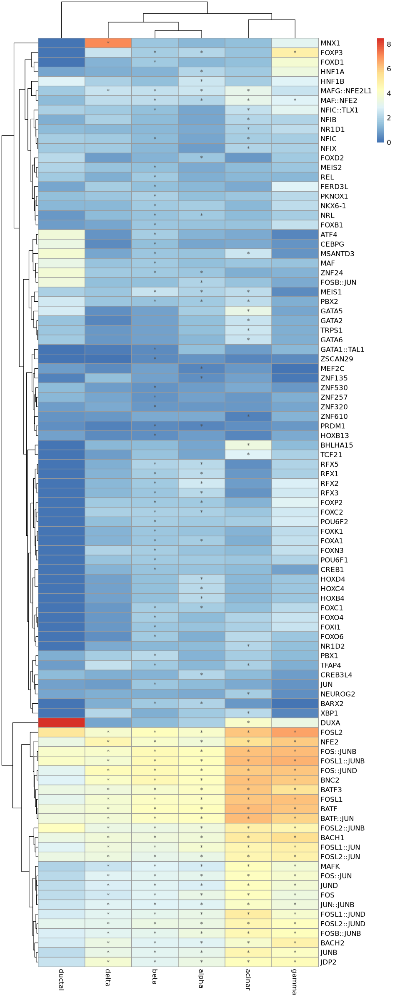

In [255]:
full.res <- read.table('/nfs/lab/welison/islet_multiome/intermediates/caQTLs/231026_WE_caQTLs/motifs/240708_Fisher_ct_motif_enrichment_JASPAR.tsv',
                      header=T, sep='\t')
#full.res

heat_data <- select(full.res, estimate, motif, cell) %>%
    pivot_wider(values_from=estimate, names_from=cell) %>%
    tibble::column_to_rownames(var='motif') %>%
    as.matrix()

#head(heat_data)

heat_lab <- select(full.res, q.value, motif, cell) 
heat_lab$q.value <- heat_lab$q.value < 0.05
heat_lab$lab <- ''
heat_lab$lab[heat_lab$q.value] <- '*'
heat_lab <- select(heat_lab, -q.value)

heat_lab <- pivot_wider(heat_lab, values_from=lab, names_from=cell) %>%
    tibble::column_to_rownames(var='motif') %>%
    as.matrix()

#head(heat_lab)

options(repr.plot.width=8, repr.plot.height=20)
pheatmap(heat_data[unique(filter(full.res, q.value < 0.05)$motif),], scale='none',
        display_numbers =heat_lab[unique(filter(full.res, q.value < 0.05)$motif),])

In [212]:
heat_data <- select(full.res, estimate, motif, cell) %>%
    pivot_wider(values_from=estimate, names_from=cell) %>%
    tibble::column_to_rownames(var='motif') %>%
    as.matrix()

head(heat_data)

,beta,alpha,acinar,ductal,delta,gamma
FOS::JUND,4.420757,4.198283,5.972486,3.025758,4.339476,6.094861
BNC2,4.510413,4.234000,6.111039,2.832029,4.065606,5.957727
FOSL2,4.249562,3.935357,6.083076,5.289823,3.874927,6.641490
FOS::JUNB,4.462689,4.316644,6.126788,3.912057,3.949801,6.201865
FOSL1,4.115597,4.086358,6.109273,3.111783,3.790151,6.135659
BATF,4.183061,4.268944,6.256744,3.540105,3.808892,6.101886


In [214]:
sum(unique(filter(full.res, q.value < 0.05)$motif) %in% rownames(heat_data))
length(unique(filter(full.res, q.value < 0.05)$motif))

[1] 97

[1] 97

In [ ]:
[unique(filter(full.res, q.value < 0.05)$motif),]

In [210]:
unique(filter(full.res, q.value < 0.05)$motif)

[1] "FOS::JUND"    "BNC2"         "FOSL2"        "FOS::JUNB"    "FOSL1"       
 [6] "BATF"         "BATF::JUN"    "FOSL1::JUNB"  "NFE2"         "BACH1"       
[11] "BATF3"        "FOSL1::JUN"   "FOSL2::JUND"  "FOS::JUN"     "JUNB"        
[16] "FOSL2::JUN"   "JDP2"         "JUND"         "FOSL2::JUNB"  "BACH2"       
[21] "FOSB::JUNB"   "FOS"          "JUN::JUNB"    "FOSL1::JUND"  "MAFK"        
[26] "MAFG::NFE2L1" "MAF::NFE2"    "MEIS1"        "PBX1"         "FOXC2"       
[31] "ATF4"         "PKNOX1"       "FOXC1"        "PRDM1"        "TFAP4"       
[36] "ZNF24"        "RFX5"         "FOXP2"        "MAF"          "FOXO4"       
[41] "ZNF530"       "FOXP3"        "RFX1"         "FOXK1"        "FOXN3"       
[46] "MEIS2"        "RFX2"         "POU6F1"       "FOXO6"        "FOXA1"       
[51] "JUN"          "NRL"          "RFX3"         "CEBPG"        "FOXD1"       
[56] "POU6F2"       "MSANTD3"      "ZNF257"       "FOXB1"        "FERD3L"      
[61] "ZNF320"       "CREB1"        "HOXB13"       "BARX2"        "FOXI1"       
[66] "PBX2"         "GATA1::TAL1"  "NFIC"         "NFIC::TLX1"   "NKX6-1"      
[71] "REL"          "ZSCAN29"      "HNF1B"        "CREB3L4"      "HNF1A"       
[76] "MEF2C"        "ZNF135"       "FOXD2"        "FOSB::JUN"    "HOXC4"       
[81] "HOXB4"        "HOXD4"        "DUXA"         "NFIX"         "GATA5"       
[86] "BHLHA15"      "ZNF610"       "NR1D2"        "NFIB"         "GATA2"       
[91] "TRPS1"        "TCF21"        "GATA6"        "NEUROG2"      "XBP1"        
[96] "NR1D1"        "MNX1"

In [202]:
library(pheatmap)

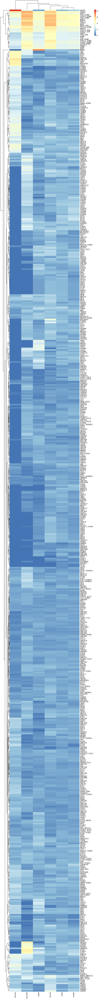

In [207]:
options(repr.plot.width=8, repr.plot.height=80)
pheatmap(select(full.res, estimate, motif, cell) %>%
    pivot_wider(values_from=estimate, names_from=cell) %>%
    tibble::column_to_rownames(var='motif') %>%
    as.matrix())

In [231]:
heat_lab <- select(full.res, q.value, motif, cell) 
heat_lab$q.value <- heat_lab$q.value < 0.05
heat_lab$lab <- ''
heat_lab$lab[heat_lab$q.value] <- '*'
heat_lab <- select(heat_lab, -q.value)

heat_lab <- pivot_wider(heat_lab, values_from=lab, names_from=cell) %>%
    tibble::column_to_rownames(var='motif') %>%
    as.matrix()

head(heat_lab)

,beta,alpha,acinar,ductal,delta,gamma
FOS::JUND,*,*,*,,*,*
BNC2,*,*,*,,*,*
FOSL2,*,*,*,,*,*
FOS::JUNB,*,*,*,,*,*
FOSL1,*,*,*,,*,*
BATF,*,*,*,,*,*


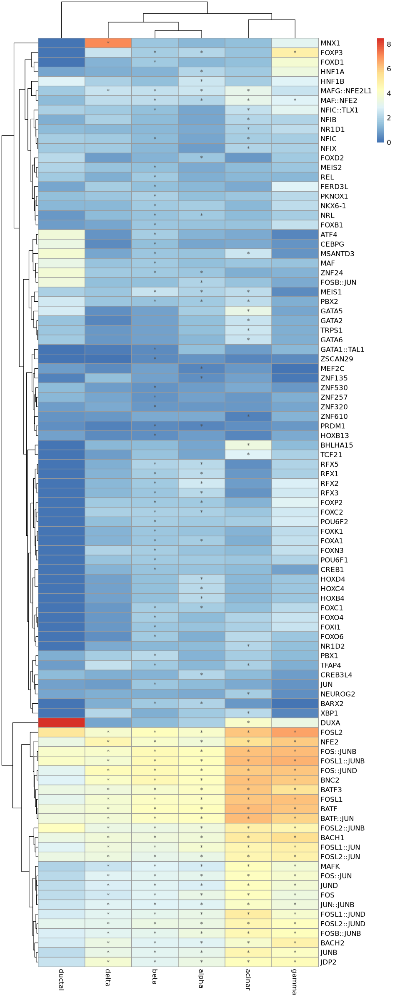

In [232]:
options(repr.plot.width=8, repr.plot.height=20)
pheatmap(heat_data[unique(filter(full.res, q.value < 0.05)$motif),], scale='none',
        display_numbers =heat_lab[unique(filter(full.res, q.value < 0.05)$motif),])

In [4]:
out.dir <- '/nfs/lab/tscc/welison/FNIH.Liver/tensorQTL/motifs/'

motifs <- read.table(paste0(out.dir,"Summary_significant_motifs_JASPAR2022_leads.tsv"), sep="\t", header=T)
#motifs <- RES
dim(motifs)
head(motifs)

[1] 9396570      16

,SNP_id,motifPos,geneSymbol,dataSource,providerName,providerId,seqMatch,pctRef,pctAlt,scoreRef,scoreAlt,Refpvalue,Altpvalue,altPos,alleleDiff,effect
,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<int>,<dbl>,<chr>
1,chr11:121145002:C:T,-1,TCFL5,jaspar2022,MA0632.2,MA0632.2,aattctgacCacgggctca,0.8997731,0.7082916,9.488793,7.488901,NA,NA,1,-1.999892,strong
2,chr9:121487307:G:A,-8,TCFL5,jaspar2022,MA0632.2,MA0632.2,gctgcgcgcGgtgactcac,0.9276640,0.7361825,9.780094,7.780202,NA,NA,1,-1.999892,strong
3,chr11:123268127:A:G,-8,TCFL5,jaspar2022,MA0632.2,MA0632.2,gttgcccgtGagcccgcca,0.7006807,0.8921623,7.409411,9.409302,NA,NA,1,1.999892,strong
4,chr12:5432005:G:A,-8,TCFL5,jaspar2022,MA0632.2,MA0632.2,gcggcgcggGccggcgggg,0.9106367,0.7191551,9.602255,7.602364,NA,NA,1,-1.999892,strong
5,chr10:21160516:C:T,-1,TCFL5,jaspar2022,MA0632.2,MA0632.2,cttaattatCacgtgcctt,0.9098305,0.7183489,9.593835,7.593943,NA,NA,1,-1.999892,strong
6,chr12:8996148:C:T,-1,TCFL5,jaspar2022,MA0632.2,MA0632.2,aagaaaacaCgcgtgcacg,0.8938844,0.7024029,9.427290,7.427398,NA,NA,1,-1.999892,strong


In [7]:
filter(motifs, str_detect(SNP_id, 'chr2:232645051')) # rs7604422
filter(motifs, str_detect(SNP_id, 'chr2:232645301')) # rs11683367
filter(motifs, str_detect(SNP_id, 'chr2:232648465')) # rs2140773
filter(motifs, str_detect(SNP_id, 'chr2:232645141')) # rs11689178

SNP_id,motifPos,geneSymbol,dataSource,providerName,providerId,seqMatch,pctRef,pctAlt,scoreRef,scoreAlt,Refpvalue,Altpvalue,altPos,alleleDiff,effect
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<int>,<dbl>,<chr>
chr2:232645051:C:A,-3,ARGFX,jaspar2022,MA1463.1,MA1463.1,aaatgctggAattagaggt,0.7036001,0.8826523,7.859213,9.827013,NA,NA,1,1.9678007,strong
chr2:232645051:C:A,-9,ATF4,jaspar2022,MA0833.2,MA0833.2,cctaaaatgctggAattagaggtgtga,0.7006218,0.8377222,9.663159,11.526725,NA,NA,1,1.8635658,strong
chr2:232645051:C:A,-11,HSF2,jaspar2022,MA0770.1,MA0770.1,ctaaaatgctggAattagaggtgtg,0.6740771,0.7859674,10.702355,12.457463,NA,NA,1,1.7551083,strong
chr2:232645051:C:A,-9,CEBPG,jaspar2022,MA1636.1,MA1636.1,tcctaaaatgctggAattagaggtgtgag,0.7025507,0.8464941,8.516598,10.219643,NA,NA,1,1.7030444,strong
chr2:232645051:C:A,-5,TEAD4,jaspar2022,MA0809.2,MA0809.2,taaaatgctggAattagaggtgt,0.7075590,0.8396420,7.366283,8.708265,NA,NA,1,1.3419823,strong
chr2:232645051:C:A,-2,PAX4,jaspar2022,MA0068.2,MA0068.2,atgctggAattagag,0.7792845,0.9403740,6.595911,7.927802,NA,NA,1,1.3318909,strong
chr2:232645051:C:A,-11,NRL,jaspar2022,MA0842.2,MA0842.2,ctaaaatgctggCattagaggtgtg,0.8354382,0.7380130,11.311156,10.004358,NA,NA,1,-1.3067976,strong
chr2:232645051:C:A,-6,TEAD1,jaspar2022,MA0090.3,MA0090.3,ctaaaatgctggAattagaggtgtg,0.7120779,0.8266830,8.120541,9.393123,NA,NA,1,1.2725823,strong
chr2:232645051:C:A,-3,HOXB7,jaspar2022,MA1501.1,MA1501.1,aaatgctggAattagaggt,0.8468202,0.9258366,7.787256,8.508298,NA,NA,1,0.7210418,strong


SNP_id,motifPos,geneSymbol,dataSource,providerName,providerId,seqMatch,pctRef,pctAlt,scoreRef,scoreAlt,Refpvalue,Altpvalue,altPos,alleleDiff,effect
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<int>,<dbl>,<chr>
chr2:232645301:C:T,-6,PLAGL2,jaspar2022,MA1548.1,MA1548.1,aggatggccCcctgcctcg,0.9322009,0.7503874,10.269868,8.281914,NA,NA,1,-1.9879541,strong
chr2:232645301:C:T,-6,ZNF417,jaspar2022,MA1727.1,MA1727.1,gtaggaggatggccCcctgcctcgtgccc,0.8665938,0.7178637,11.496638,9.547986,NA,NA,1,-1.9486525,strong
chr2:232645301:C:T,-4,GLIS2,jaspar2022,MA0736.1,MA0736.1,taggaggatggccCcctgcctcgtgcc,0.8457778,0.7253685,12.608561,10.827102,NA,NA,1,-1.7814590,strong
chr2:232645301:C:T,-3,MAZ,jaspar2022,MA1522.1,MA1522.1,gaggatggccCcctgcctcgt,0.8526993,0.7214983,11.424535,9.679507,NA,NA,1,-1.7450279,strong
chr2:232645301:C:T,-4,INSM1,jaspar2022,MA0155.1,MA0155.1,ggaggatggccCcctgcctcgtg,0.8857922,0.7268236,9.535031,7.847295,NA,NA,1,-1.6877369,strong
chr2:232645301:C:T,-3,ZNF148,jaspar2022,MA1653.1,MA1653.1,ggaggatggccCcctgcctcgtg,0.8262717,0.7094501,10.100618,8.709108,NA,NA,1,-1.3915095,strong
chr2:232645301:C:T,-5,ZIC5,jaspar2022,MA1584.1,MA1584.1,agtaggaggatggccCcctgcctcgtgccca,0.7718887,0.6966585,13.134388,11.866338,NA,NA,1,-1.2680499,strong
chr2:232645301:C:T,-15,ZKSCAN3,jaspar2022,MA1973.1,MA1973.1,ggaagtaggaggatggccCcctgcctcgtgcccacggc,0.7457011,0.6618604,11.474439,10.224508,NA,NA,1,-1.2499311,strong
chr2:232645301:C:T,-4,ZIC1,jaspar2022,MA0696.1,MA0696.1,taggaggatggccCcctgcctcgtgcc,0.7932919,0.7284396,13.254239,12.179434,NA,NA,1,-1.0748050,strong


SNP_id,motifPos,geneSymbol,dataSource,providerName,providerId,seqMatch,pctRef,pctAlt,scoreRef,scoreAlt,Refpvalue,Altpvalue,altPos,alleleDiff,effect
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<int>,<dbl>,<chr>
chr2:232648465:C:A,-7,KLF5,jaspar2022,MA0599.1,MA0599.1,aggacccacCcaaccagag,0.8839230,0.7093019,10.152599,8.153692,NA,NA,1,-1.9989068,strong
chr2:232648465:C:A,-6,KLF14,jaspar2022,MA0740.2,MA0740.2,ggacccacCcaaccaga,0.8556008,0.6938787,10.326578,8.377843,NA,NA,1,-1.9487348,strong
chr2:232648465:C:A,-8,KLF2,jaspar2022,MA1515.1,MA1515.1,gaggacccacCcaaccagaga,0.9050931,0.7375602,7.861280,6.437622,NA,NA,1,-1.4236578,strong
chr2:232648465:C:A,-8,KLF4,jaspar2022,MA0039.4,MA0039.4,ggaggacccacCcaaccagagaa,0.8846398,0.7487955,8.604711,7.318052,NA,NA,1,-1.2866594,strong
chr2:232648465:C:A,-7,GLI3,jaspar2022,MA1491.2,MA1491.2,tggggaggacccacCcaaccagagaaaact,0.7200780,0.6669393,15.085046,13.979131,NA,NA,1,-1.1059146,strong
chr2:232648465:C:A,-9,KLF9,jaspar2022,MA1107.2,MA1107.2,tggggaggacccacCcaaccagagaaaact,0.8181408,0.7411897,9.797978,8.906667,NA,NA,1,-0.8913110,strong
chr2:232648465:C:A,-13,ZNF274,jaspar2022,MA1592.1,MA1592.1,tggggaggacccacAcaaccagagaaaact,0.8345640,0.8636975,12.503258,12.936496,NA,NA,1,0.4332372,weak


SNP_id,motifPos,geneSymbol,dataSource,providerName,providerId,seqMatch,pctRef,pctAlt,scoreRef,scoreAlt,Refpvalue,Altpvalue,altPos,alleleDiff,effect
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<int>,<dbl>,<chr>
chr2:232645141:T:C,-11,MAF::NFE2,jaspar2022,MA0501.1,MA0501.1,gtcatgttgctgaaTgaagggaaattctt,0.7721761,0.6448759,12.223304,10.23443,NA,NA,1,-1.988872,strong
chr2:232645141:T:C,-9,MAFG::NFE2L1,jaspar2022,MA0089.2,MA0089.2,agtcatgttgctgaaTgaagggaaattcttt,0.7575419,0.6380480,12.315363,10.39672,NA,NA,1,-1.918645,strong
chr2:232645141:T:C,-6,ZNF282,jaspar2022,MA1154.1,MA1154.1,agtcatgttgctgaaTgaagggaaattctttg,0.7609754,0.6571018,14.105071,12.20205,NA,NA,1,-1.903022,strong
chr2:232645141:T:C,-7,ZNF24,jaspar2022,MA1124.1,MA1124.1,catgttgctgaaTgaagggaaattc,0.8150959,0.7096154,12.845353,11.22765,NA,NA,1,-1.617706,strong
chr2:232645141:T:C,-7,ZNF143,jaspar2022,MA0088.2,MA0088.2,agtcatgttgctgaaTgaagggaaattcttt,0.7393133,0.6570596,14.432633,12.83323,NA,NA,1,-1.599403,strong
chr2:232645141:T:C,-9,MAFK,jaspar2022,MA0496.3,MA0496.3,gtcatgttgctgaaTgaagggaaattctt,0.8082948,0.6848542,8.934009,7.62999,NA,NA,1,-1.304019,strong


In [4]:
?plotMB

In [8]:
plotMB(results = filter(motifs, str_detect(SNP_id, 'chr2:232648465')), rsid = 'chr2:232648465:C:A', effect = "strong")

ERROR: Error in attr(x, "tsp") <- c(1, NROW(x), 1): invalid time series parameters specified


In [9]:
jaspar = MotifDb[mcols(MotifDb)$dataSource=='jaspar2022' & mcols(MotifDb)$organism=='Hsapiens']

snps <- snps.from.file(file = paste0(out.dir, 'lead.snps.bed'),search.genome = BSgenome.Hsapiens.UCSC.hg38,format = "bed")                                 


In [11]:
snps['chr2:232648465:C:A',]

GRanges object with 1 range and 3 metadata columns:
                     seqnames    ranges strand |             SNP_id
                        <Rle> <IRanges>  <Rle> |        <character>
  chr2:232648465:C:A     chr2 232648465      * | chr2:232648465:C:A
                                REF            ALT
                     <DNAStringSet> <DNAStringSet>
  chr2:232648465:C:A              C              A
  -------
  seqinfo: 22 sequences from hg38 genome

In [12]:
MBR_results <- motifbreakR(snpList = snps['chr2:232648465:C:A',], filterp = TRUE,
                       pwmList = jaspar,
                       method="ic",
                       threshold = 5e-4,
                       BPPARAM = BiocParallel::bpparam("SerialParam"))

MBR_results

GRanges object with 7 ranges and 23 metadata columns:
                     seqnames    ranges strand |             SNP_id
                        <Rle> <IRanges>  <Rle> |        <character>
  chr2:232648465:C:A     chr2 232648465      - | chr2:232648465:C:A
  chr2:232648465:C:A     chr2 232648465      + | chr2:232648465:C:A
  chr2:232648465:C:A     chr2 232648465      + | chr2:232648465:C:A
  chr2:232648465:C:A     chr2 232648465      + | chr2:232648465:C:A
  chr2:232648465:C:A     chr2 232648465      + | chr2:232648465:C:A
  chr2:232648465:C:A     chr2 232648465      - | chr2:232648465:C:A
  chr2:232648465:C:A     chr2 232648465      + | chr2:232648465:C:A
                                REF            ALT     varType motifPos
                     <DNAStringSet> <DNAStringSet> <character>   <list>
  chr2:232648465:C:A              C              A         SNV  -13,  2
  chr2:232648465:C:A              C              A         SNV    -9, 6
  chr2:232648465:C:A              C           

png 
  2

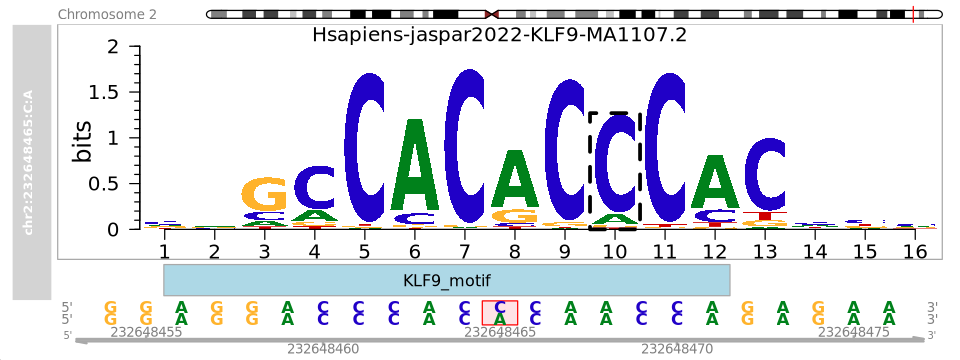

In [20]:
snp_id  = 'chr2:232648465:C:A'
#snp_split <- str_split(snp_id, ":", simplify=T)
motifs <- c('KLF9')

MBR_results.sub <- subset(MBR_results, geneSymbol %in% motifs)

options(repr.plot.width=8, repr.plot.height=3)
plotMB(results = MBR_results.sub, rsid = snp_id, effect = "strong")

fp <-paste0('/nfs/lab/welison/Liver/Plots/241221_EFHD1_disrupted_KLF.pdf')
pdf(fp, width=8, height=3)
plotMB(results = MBR_results.sub, rsid = snp_id, effect = "strong")
dev.off()

In [5]:
filter(motifs, str_detect(SNP_id, 'chr12:52873026')) # rs4919766
filter(motifs, str_detect(SNP_id, 'chr12:52879136')) # rs4919741 chr12:52874432
filter(motifs, str_detect(SNP_id, 'chr12:52883839')) # rs61927887

SNP_id,motifPos,geneSymbol,dataSource,providerName,providerId,seqMatch,pctRef,pctAlt,scoreRef,scoreAlt,Refpvalue,Altpvalue,altPos,alleleDiff,effect
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<int>,<dbl>,<chr>
chr12:52873026:A:G,-5,ZNF257,jaspar2022,MA1710.1,MA1710.1,tgacagtggagGaaggatggggt,0.7138744,0.8789020,8.514838,10.463536,NA,NA,1,1.9486982,strong
chr12:52873026:A:G,-1,EWSR1-FLI1,jaspar2022,MA0149.1,MA0149.1,tcaggtgacagtggagGaaggatggggtgactgc,0.6204939,0.6763605,19.193103,20.911928,NA,NA,1,1.7188252,strong
chr12:52873026:A:G,-5,PRDM1,jaspar2022,MA0508.3,MA0508.3,gacagtggagAaaggatgggg,0.9916958,0.8460282,10.662496,9.122406,NA,NA,1,-1.5400902,strong
chr12:52873026:A:G,-8,ZNF263,jaspar2022,MA0528.2,MA0528.2,tgacagtggagGaaggatggggt,0.7291722,0.8682660,7.834341,9.284821,NA,NA,1,1.4504794,strong
chr12:52873026:A:G,-3,PLAG1,jaspar2022,MA0163.1,MA0163.1,ggtgacagtggagGaaggatggggtga,0.6610542,0.7546752,9.400432,10.698452,NA,NA,1,1.2980199,strong
chr12:52873026:A:G,-5,ELF3,jaspar2022,MA0640.2,MA0640.2,ggtgacagtggagGaaggatggggtga,0.7525185,0.8675949,7.893800,9.059164,NA,NA,1,1.1653640,strong
chr12:52873026:A:G,-6,ELF1,jaspar2022,MA0473.3,MA0473.3,ggtgacagtggagGaaggatggggtga,0.7137949,0.8085249,8.158601,9.204084,NA,NA,1,1.0454835,strong
chr12:52873026:A:G,-6,ETV1,jaspar2022,MA0761.2,MA0761.2,ggtgacagtggagGaaggatggggtga,0.7501289,0.8363647,8.004653,8.893065,NA,NA,1,0.8884125,strong
chr12:52873026:A:G,-6,GABPA,jaspar2022,MA0062.3,MA0062.3,ggtgacagtggagGaaggatggggtga,0.7386536,0.8165107,7.643593,8.414560,NA,NA,1,0.7709677,strong


SNP_id,motifPos,geneSymbol,dataSource,providerName,providerId,seqMatch,pctRef,pctAlt,scoreRef,scoreAlt,Refpvalue,Altpvalue,altPos,alleleDiff,effect
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<int>,<dbl>,<chr>


SNP_id,motifPos,geneSymbol,dataSource,providerName,providerId,seqMatch,pctRef,pctAlt,scoreRef,scoreAlt,Refpvalue,Altpvalue,altPos,alleleDiff,effect
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<int>,<dbl>,<chr>


In [7]:
filter(motifs, str_detect(SNP_id, 'chr12:5287')) # rs61927887 

SNP_id,motifPos,geneSymbol,dataSource,providerName,providerId,seqMatch,pctRef,pctAlt,scoreRef,scoreAlt,Refpvalue,Altpvalue,altPos,alleleDiff,effect
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<int>,<dbl>,<chr>
chr12:52879301:A:C,-8,STAT3,jaspar2022,MA0144.2,MA0144.2,gtctccaaggAagggtttggg,0.8793260,0.7032045,10.022268,8.022980,NA,NA,1,-1.999289,strong
chr12:52874432:G:A,-5,KLF15,jaspar2022,MA1513.1,MA1513.1,ccccagacccGcccgctaagc,0.9782433,0.8306863,13.368111,11.369403,NA,NA,1,-1.998708,strong
chr12:52872161:C:T,-2,NRL,jaspar2022,MA0842.2,MA0842.2,ccagaatctgtgTcagcctcctggc,0.6829941,0.8318667,9.266372,11.263250,NA,NA,1,1.996878,strong
chr12:52877187:G:A,-9,GLI3,jaspar2022,MA1491.2,MA1491.2,cttctcctttttagGtggacccctcctcac,0.7243340,0.6284893,15.173622,13.178916,NA,NA,1,-1.994706,strong
chr12:52878231:T:C,-10,ZNF274,jaspar2022,MA1592.1,MA1592.1,acgtggtcagaactCgtctgtacaaaaaat,0.6500217,0.7839197,9.758979,11.750141,NA,NA,1,1.991162,strong
chr12:5287094:T:C,-6,ZNF410,jaspar2022,MA0752.1,MA0752.1,gtttgtcatagatagcCcttattattttgaaat,0.6110013,0.6953345,14.295017,16.256737,NA,NA,1,1.961720,strong
chr12:52871715:G:A,-2,ESRRB,jaspar2022,MA0141.3,MA0141.3,caggaaggacAtggtcacatc,0.6908046,0.8182379,10.693994,12.653541,NA,NA,1,1.959547,strong
chr12:52877657:A:G,-7,ZNF281,jaspar2022,MA1630.2,MA1630.2,ctctgggggacGggtctttgcac,0.8256272,0.9495050,13.040069,14.988804,NA,NA,1,1.948735,strong
chr12:52870908:C:T,-9,ZNF574,jaspar2022,MA1982.1,MA1982.1,atatctgggggctcTaggccatcagcaac,0.6784083,0.8283922,9.007867,10.956565,NA,NA,1,1.948698,strong


In [10]:
table(filter(motifs, str_detect(SNP_id, 'chr12:5287'))$geneSymbol)


       CREB3      CREB3L4         CTCF        CTCFL         E2F6         EBF1 
           1            1            1            2            1            1 
        EGR1          EHF         ELF1         ELF3         ELF4         ELK1 
           1            1            2            2            1            1 
  ERF::NHLH1         ESR1         ESR2        ESRRA        ESRRB         ETV1 
           1            1            1            1            1            2 
 ETV2::FIGLA   ETV5::DRGX  ETV5::FIGLA  ETV5::HOXA2   EWSR1-FLI1          FOS 
           1            2            1            1            1            1 
  FOSL1::JUN        GABPA        GATA1  GATA1::TAL1        GATA4         GFI1 
           1            2            1            1            1            1 
        GLI3        GLIS3        GRHL2        HAND2         HES6 HOXD12::ELK1 
           2            1            1            1            1            1 
         JUN    JUN::JUNB        KLF10        KLF11